Jing_Chang_AHAssadi_ADHD_2024.ipynb

EEG Spectral Band Analysis in Mental Health: Insights from Explainable AI in Functional Connectivity
Jing Chang and Amir Assadi

Abstract. This study investigates the functional connectivity in the theta (4-8 Hz) and beta (13-30 Hz) EEG spectral bands in individuals with ADHD using Explainable Artificial Intelligence (XAI). We compare con-nectivity patterns between ADHD and non-ADHD groups using XAI-created functional connectivity graphs across different emotional states. Through the computation of functional connectivity matrices, Independent Component Analysis (ICA), and the creation of emotion distance matrices, our analysis reveals notable differences in EEG connectivity, particularly in the theta and beta bands. These findings enhance our understanding of ADHD's neurobiological underpinnings and suggest potential biomarkers for future clinical applications.

Explanation for Explainable AI (XAI)

Explainable AI (XAI) refers to the development of machine learning models and techniques that provide clear, understandable, and transparent insights into their decision-making processes. In the context of EEG data analysis, XAI is crucial for interpreting complex neural patterns and connectivity, especially when diagnosing and understanding neurodevelopmental disorders like ADHD. XAI enables researchers and clinicians to visualize and interpret the underlying neural dynamics, making the results more accessible and actionable. There are several algorithms and techniques used to implement XAI, each with its own strengths and applications. Three commonly used algorithms for XAI implementation are:

LIME (Local Interpretable Model-agnostic Explanations): LIME is a model-agnostic technique that explains the predictions of any classifier by approximating it locally with an interpretable model, such as a linear model. It works by perturbing the input data and observing the corresponding changes in the model's predictions, thereby identifying the features that are most influential in the decision-making process.

SHAP (SHapley Additive exPlanations): SHAP is a game-theoretic approach that provides a unified measure of feature importance by computing the contribution of each feature to the prediction. It leverages the concept of Shapley values from cooperative game theory to ensure that the explanations are consistent and fair across different models.

Grad-CAM (Gradient-weighted Class Activation Mapping): Grad-CAM is a visualization technique that highlights the regions of the input data (e.g., EEG signals) that are most relevant to the model's decision. It works by computing the gradients of the target concept (e.g., a specific class) with respect to the feature maps of the model, and then generating a heatmap that visualizes the important regions.

Description of XAI Graphs and Computation

XAI graphs are a powerful tool for visualizing and interpreting the functional connectivity patterns in EEG data. These graphs represent the relationships between different brain regions or independent components derived from EEG signals. The computation of XAI graphs involves several steps:

Independent Component Analysis (ICA): ICA is applied to the EEG data to separate the signals into statistically independent components. These components represent the underlying sources of neural activity.

Component Selection: The most important independent components are selected based on their contribution to the overall signal. This is typically done by computing the norm of the mixing matrix from the ICA.

Coherence Calculation: Coherence is calculated between the selected independent components in different spectral bands (e.g., theta, beta). Coherence measures the synchronization between two signals and is used to generate weighted edges in the XAI graphs.

Graph Construction: The coherence values are used to construct a weighted graph, where nodes represent the independent components and edges represent the functional connectivity between them. The weights on the edges indicate the strength of the coherence.

Visualization: The XAI graphs are visualized using network analysis tools, such as networkx in Python. This allows researchers to interpret the connectivity patterns and identify key components that differentiate between ADHD and non-ADHD groups.

In [2]:
# In the code, use the data in def main():
# adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}
# non_adhd_data = {emotion: load_eeg_data('non_ADHD_csv', emotion) for emotion in EMOTIONS}

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal
from scipy.stats import pearsonr
from sklearn.decomposition import FastICA
import networkx as nx
import re
import plotly.graph_objs as go
import plotly.offline as pyo

# EEG frequency bands
FREQ_BANDS = {
    'delta': (0.5, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30),
    'gamma': (30, 100)
}

EMOTIONS = ['A', 'H', 'N', 'S']  # Angry, Happy, Neutral, Sad

def load_eeg_data(directory, emotion, n_subjects=5):
    data = {}
    subject_count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.startswith(emotion) and file.endswith('.csv'):
                match = re.search(rf'{emotion}(\d+)', file)
                if match:
                    subject = int(match.group(1))
                    filepath = os.path.join(root, file)
                    try:
                        df = pd.read_csv(filepath)
                        data[subject] = df
                        subject_count += 1
                        if subject_count == n_subjects:
                            return data
                    except Exception as e:
                        print(f"Error loading file {filepath}: {str(e)}")
    return data

def compute_functional_connectivity(data):
    n_channels = data.shape[1]
    fc_matrix = np.zeros((n_channels, n_channels))
    for i in range(n_channels):
        for j in range(i+1, n_channels):
            corr, _ = pearsonr(data[:, i], data[:, j])
            fc_matrix[i, j] = fc_matrix[j, i] = corr
    return fc_matrix

def compute_eigendecomposition(matrix):
    eigenvalues, eigenvectors = np.linalg.eig(matrix)
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]
    return eigenvalues / np.sum(eigenvalues), eigenvectors

def apply_bss(data, n_components=20):
    ica = FastICA(n_components=n_components, random_state=42)
    components = ica.fit_transform(data)
    return components, ica.mixing_

def xai_component_selection(components, mixing_matrix, n_select=10):
    component_importance = np.linalg.norm(mixing_matrix, axis=0)
    selected_indices = np.argsort(component_importance)[::-1][:n_select]
    return selected_indices

def compute_coherence(x, y, fs=256, nperseg=256):
    f, Cxy = signal.coherence(x, y, fs=fs, nperseg=nperseg)
    return f, Cxy

def create_xai_graphs(components, selected_indices):
    graphs = {band: nx.Graph() for band in FREQ_BANDS}
    
    for i, idx1 in enumerate(selected_indices):
        for j, idx2 in enumerate(selected_indices[i+1:], start=i+1):
            f, Cxy = compute_coherence(components[:, idx1], components[:, idx2])
            for band, (low, high) in FREQ_BANDS.items():
                mask = (f >= low) & (f <= high)
                coherence = np.mean(Cxy[mask])
                graphs[band].add_edge(idx1, idx2, weight=coherence)
    
    return graphs

def visualize_xai_graph(graph, title, save_path):
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, with_labels=True, node_color='lightblue', 
            node_size=500, font_size=10, font_weight='bold')
    edge_weights = nx.get_edge_attributes(graph, 'weight')
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_weights)
    plt.title(title)
    plt.axis('off')
    plt.savefig(save_path)
    plt.close()

def compute_graph_distance(graph1, graph2):
    common_nodes = set(graph1.nodes()) & set(graph2.nodes())
    distance = 0
    for node1 in common_nodes:
        for node2 in common_nodes:
            if node1 != node2:
                weight1 = graph1[node1].get(node2, {}).get('weight', 0)
                weight2 = graph2[node1].get(node2, {}).get('weight', 0)
                distance += (weight1 - weight2) ** 2
    return np.sqrt(distance)

def compute_graph_distances(graphs1, graphs2):
    distances = {}
    for band in FREQ_BANDS:
        distances[band] = compute_graph_distance(graphs1[band], graphs2[band])
    return distances

def plot_graph_distances(distances, title, save_path):
    plt.figure(figsize=(10, 6))
    plt.bar(distances.keys(), distances.values())
    plt.title(title)
    plt.xlabel('Frequency Band')
    plt.ylabel('Graph Distance')
    plt.savefig(save_path)
    plt.close()

def compute_emotion_distance_matrix(emotion_graphs):
    n_emotions = len(EMOTIONS)
    distance_matrix = np.zeros((n_emotions, n_emotions))
    for i, emotion1 in enumerate(EMOTIONS):
        for j, emotion2 in enumerate(EMOTIONS):
            if i < j:
                distances = compute_graph_distances(emotion_graphs[emotion1], emotion_graphs[emotion2])
                distance_matrix[i, j] = distance_matrix[j, i] = np.mean(list(distances.values()))
    return distance_matrix

def plot_emotion_distance_matrix(distance_matrix, title, save_path):
    plt.figure(figsize=(10, 8))
    sns.heatmap(distance_matrix, annot=True, cmap='coolwarm', xticklabels=EMOTIONS, yticklabels=EMOTIONS)
    plt.title(title)
    plt.savefig(save_path)
    plt.close()

def plot_emotion_distance_matrix_plotly(distance_matrix, title, save_path):
    fig = go.Figure(data=go.Heatmap(
        z=distance_matrix,
        x=EMOTIONS,
        y=EMOTIONS,
        colorscale='Viridis',
        colorbar=dict(title='Distance')
    ))
    fig.update_layout(
        title=title,
        xaxis_title='Emotions',
        yaxis_title='Emotions',
        width=800,
        height=800
    )
    pyo.plot(fig, filename=save_path, auto_open=False)

def plot_3d_ica_components(components, selected_indices, title, save_path):
    fig = go.Figure()
    
    for i, idx in enumerate(selected_indices):
        # Ensure we do not exceed the bounds of the array
        if idx + 2 < components.shape[1]:
            fig.add_trace(go.Scatter3d(
                x=components[:, idx],
                y=components[:, idx+1],
                z=components[:, idx+2],
                mode='markers',
                marker=dict(
                    size=4,
                    color=i,                # set color to an array/list of desired values
                    colorscale='Viridis',   # choose a colorscale
                    opacity=0.8
                ),
                name=f'Component {idx}'
            ))
    
    fig.update_layout(
        title=title,
        scene=dict(
            xaxis_title='ICA Component 1',
            yaxis_title='ICA Component 2',
            zaxis_title='ICA Component 3'
        ),
        width=800,
        height=800
    )
    
    pyo.plot(fig, filename=save_path, auto_open=False)

def plot_time_frequency_analysis(data, fs, title, save_path):
    f, t, Sxx = signal.spectrogram(data, fs=fs, nperseg=256)
    
    fig = go.Figure(data=go.Heatmap(
        x=t,
        y=f,
        z=10 * np.log10(Sxx),  # Convert to dB
        colorscale='Viridis'
    ))
    
    fig.update_layout(
        title=title,
        xaxis_title='Time [sec]',
        yaxis_title='Frequency [Hz]',
        width=800,
        height=800
    )
    
    pyo.plot(fig, filename=save_path, auto_open=False)

def plot_interactive_network_graph(graph, title, save_path):
    pos = nx.spring_layout(graph)
    edge_x = []
    edge_y = []
    for edge in graph.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.append(x0)
        edge_x.append(x1)
        edge_x.append(None)
        edge_y.append(y0)
        edge_y.append(y1)
        edge_y.append(None)

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.5, color='#888'),
        hoverinfo='none',
        mode='lines')

    node_x = []
    node_y = []
    for node in graph.nodes():
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers',
        hoverinfo='text',
        marker=dict(
            showscale=True,
            colorscale='YlGnBu',
            reversescale=True,
            color=[],
            size=10,
            colorbar=dict(
                thickness=15,
                title='Node Connections',
                xanchor='left',
                titleside='right'
            ),
            line_width=2))

    node_adjacencies = []
    node_text = []
    for node, adjacencies in enumerate(graph.adjacency()):
        node_adjacencies.append(len(adjacencies[1]))
        node_text.append(f'Node {node}<br># of connections: {len(adjacencies[1])}')

    node_trace.marker.color = node_adjacencies
    node_trace.text = node_text

    fig = go.Figure(data=[edge_trace, node_trace],
                    layout=go.Layout(
                        title=title,
                        titlefont_size=16,
                        showlegend=False,
                        hovermode='closest',
                        margin=dict(b=20, l=5, r=5, t=40),
                        annotations=[dict(
                            text="",
                            showarrow=False,
                            xref="paper", yref="paper",
                            x=0.005, y=-0.002)],
                        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
                        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False)))

    pyo.plot(fig, filename=save_path, auto_open=False)

# In the code, use the data in def main():
# adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}
# non_adhd_data = {emotion: load_eeg_data('non_ADHD_csv', emotion) for emotion in EMOTIONS}

def main():
    adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}
    non_adhd_data = {emotion: load_eeg_data('non_ADHD_csv', emotion) for emotion in EMOTIONS}

    groups = {'ADHD': adhd_data, 'Non-ADHD': non_adhd_data}
    xai_graphs = {group: {} for group in groups}

    # Create the output directory if it doesn't exist
    output_dir = 'oct2024'
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    for group, data in groups.items():
        print(f"\nProcessing {group}")
        
        for emotion in EMOTIONS:
            if not data[emotion]:
                print(f"No data available for {group}, Emotion: {emotion}")
                continue
            
            combined_data = np.concatenate([subject_data.values for subject_data in data[emotion].values()], axis=0)
            print(f"Combined data shape for {group}, Emotion {emotion}: {combined_data.shape}")
            
            fc_matrix = compute_functional_connectivity(combined_data)
            eigenvalues, eigenvectors = compute_eigendecomposition(fc_matrix)
            components, mixing_matrix = apply_bss(combined_data)
            selected_indices = xai_component_selection(components, mixing_matrix)
            xai_graphs[group][emotion] = create_xai_graphs(components, selected_indices)
            
            # 3D Scatter Plot of ICA Components
            title = f"{group} - {emotion} - 3D ICA Components"
            save_path = os.path.join(output_dir, f"{title.replace(' ', '_')}.html")
            plot_3d_ica_components(components, selected_indices, title, save_path)
            
            # Time-Frequency Analysis
            title = f"{group} - {emotion} - Time-Frequency Analysis"
            save_path = os.path.join(output_dir, f"{title.replace(' ', '_')}.html")
            plot_time_frequency_analysis(combined_data[:, 0], fs=256, title=title, save_path=save_path)
            
            # Interactive Network Graph Visualization
            for band, graph in xai_graphs[group][emotion].items():
                title = f"{group} - {emotion} - {band} band Interactive XAI Graph"
                save_path = os.path.join(output_dir, f"{title.replace(' ', '_')}.html")
                plot_interactive_network_graph(graph, title, save_path)

    # Compare ADHD and Non-ADHD XAI graphs for each emotion and frequency band
    print("\nGraph distances between ADHD and Non-ADHD:")
    for emotion in EMOTIONS:
        distances = compute_graph_distances(xai_graphs['ADHD'][emotion], xai_graphs['Non-ADHD'][emotion])
        print(f"\nEmotion: {emotion}")
        for band, distance in distances.items():
            print(f"  {band} band: {distance}")
        title = f"ADHD vs Non-ADHD Graph Distances - Emotion: {emotion}"
        save_path = os.path.join(output_dir, f"{title.replace(' ', '_')}.png")
        plot_graph_distances(distances, title, save_path)

    # Compute and visualize emotion distance matrices for each group
    for group in groups:
        distance_matrix = compute_emotion_distance_matrix(xai_graphs[group])
        title = f"{group} - Emotion Distance Matrix"
        save_path = os.path.join(output_dir, f"{title.replace(' ', '_')}.png")
        plot_emotion_distance_matrix(distance_matrix, title, save_path)
        save_path_plotly = os.path.join(output_dir, f"{title.replace(' ', '_')}.html")
        plot_emotion_distance_matrix_plotly(distance_matrix, title, save_path_plotly)

    print("\nInterpretation of results:")
    print("1. XAI graphs visualize connectivity between important ICA components for each emotion and frequency band.")
    print("2. Graph distances between ADHD and Non-ADHD groups indicate:")
    print("   - Differences in brain connectivity patterns for each emotion")
    print("   - Variations across frequency bands, suggesting altered oscillatory behavior")
    print("3. Emotion distance matrices reveal:")
    print("   - Similarities and differences in brain connectivity across emotions within each group")
    print("   - Potential differences in emotional processing between ADHD and Non-ADHD groups")
    print("4. Larger distances suggest more pronounced differences in brain connectivity.")
    print("5. Consistent patterns across emotions or frequency bands may indicate:")
    print("   - Specific neural circuits affected in ADHD")
    print("   - Alterations in emotional processing or regulation")
    print("6. Differences in emotion distance matrices between groups could reflect:")
    print("   - Altered emotional differentiation in ADHD")
    print("   - Changes in the neural representation of emotions")

if __name__ == "__main__":
    main()


Processing ADHD
Combined data shape for ADHD, Emotion A: (476160, 60)
Combined data shape for ADHD, Emotion H: (476160, 60)
Combined data shape for ADHD, Emotion N: (476160, 60)
Combined data shape for ADHD, Emotion S: (476160, 60)

Processing Non-ADHD
Combined data shape for Non-ADHD, Emotion A: (474624, 60)
Combined data shape for Non-ADHD, Emotion H: (474624, 60)
Combined data shape for Non-ADHD, Emotion N: (474624, 60)
Combined data shape for Non-ADHD, Emotion S: (474624, 60)

Graph distances between ADHD and Non-ADHD:

Emotion: A
  delta band: 0.678929454453516
  theta band: 0.5967552488564535
  alpha band: 0.49855924885496133
  beta band: 0.5197158462208467
  gamma band: 2.357121931315977

Emotion: H
  delta band: 0.5601772214209115
  theta band: 0.8388852559761147
  alpha band: 0.9684214516358516
  beta band: 0.7594797721430561
  gamma band: 2.0734100332553917

Emotion: N
  delta band: 0.45102224445861844
  theta band: 0.8193086965756408
  alpha band: 0.875180780666652
  beta b

### **Network Visualization**


Processing ADHD
Combined data shape for ADHD, Emotion A: (476160, 60)


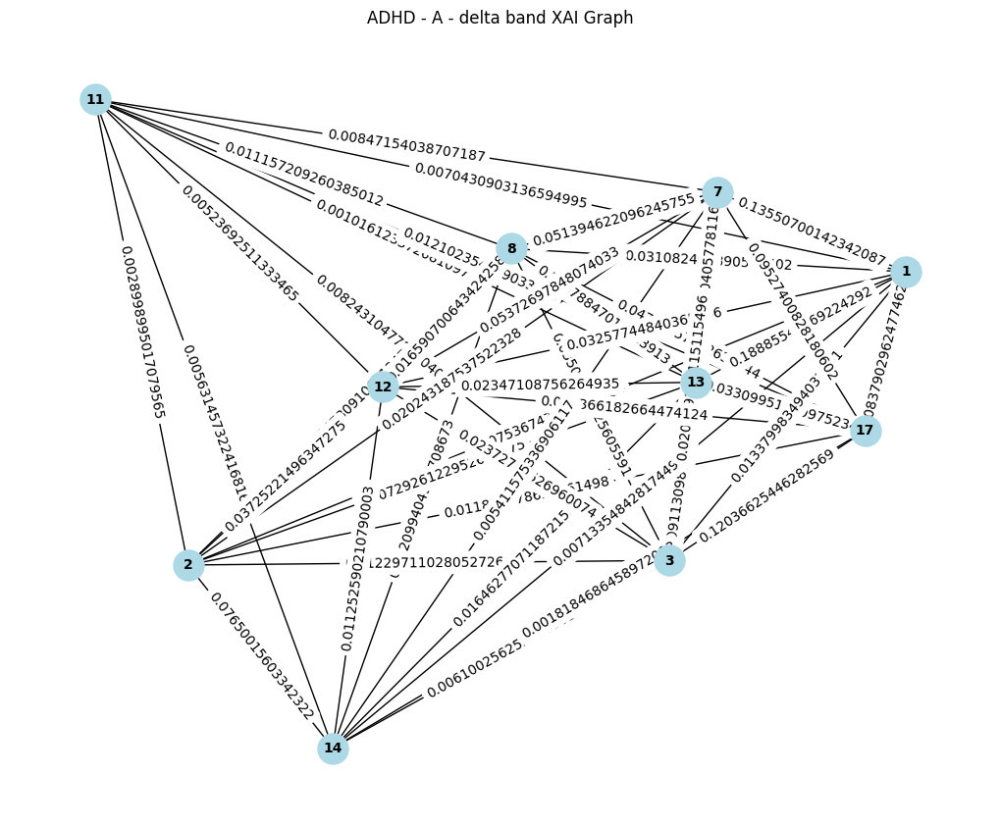

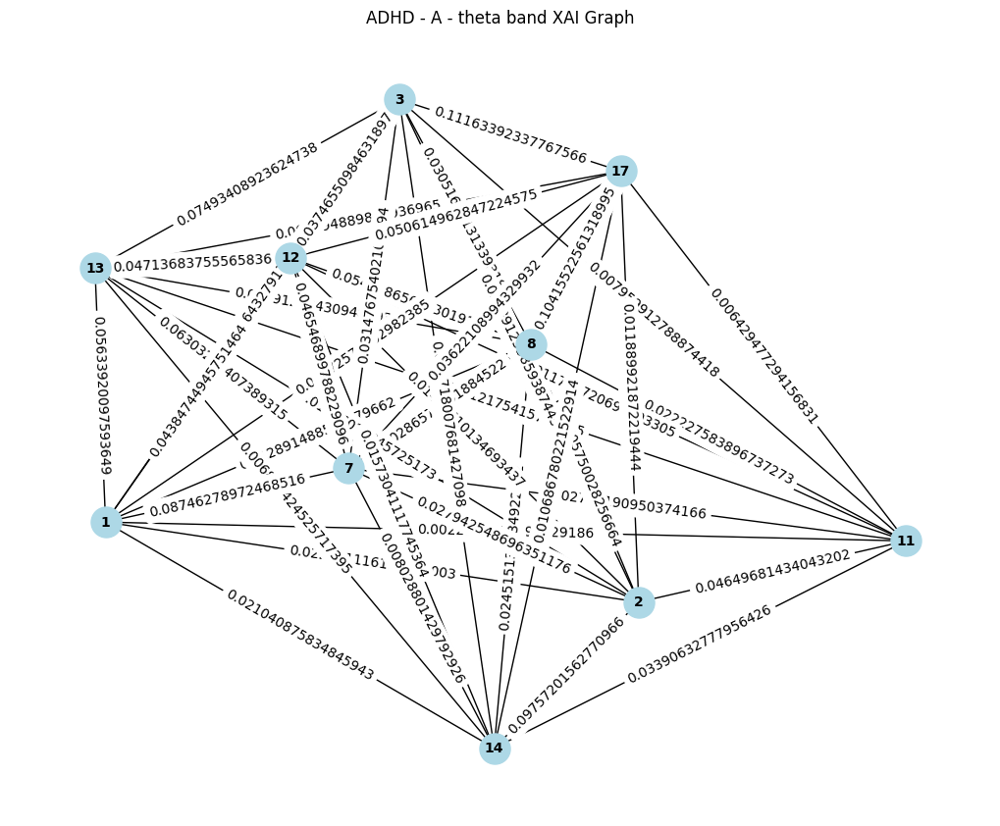

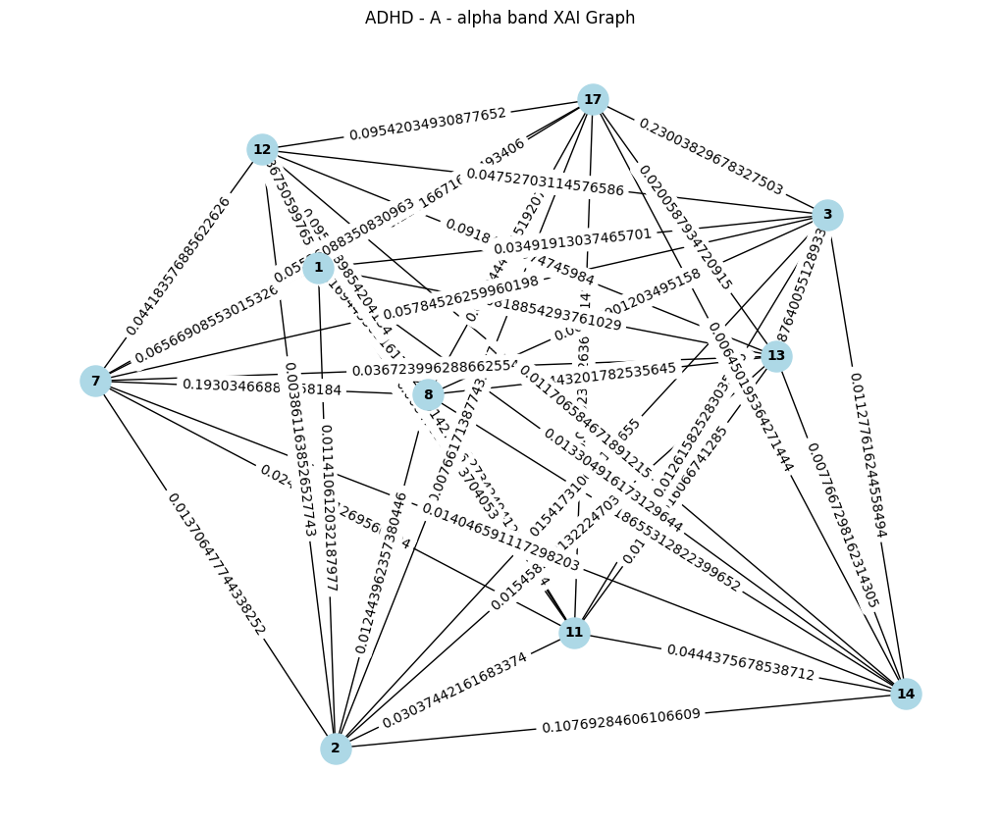

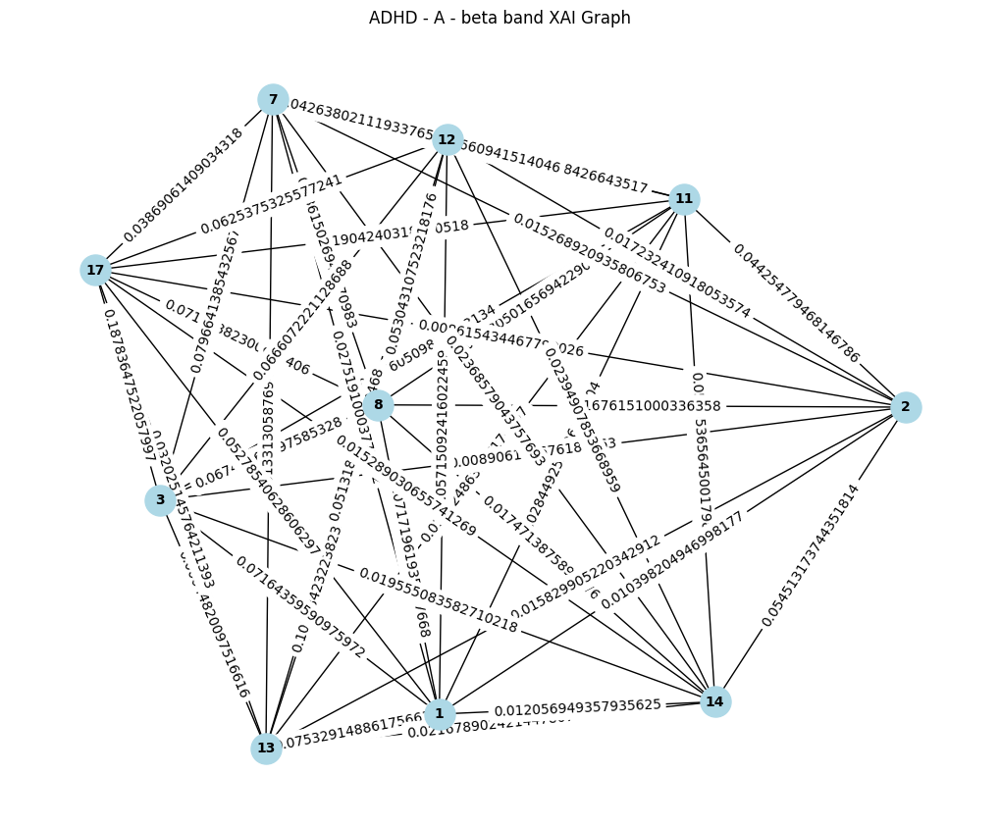

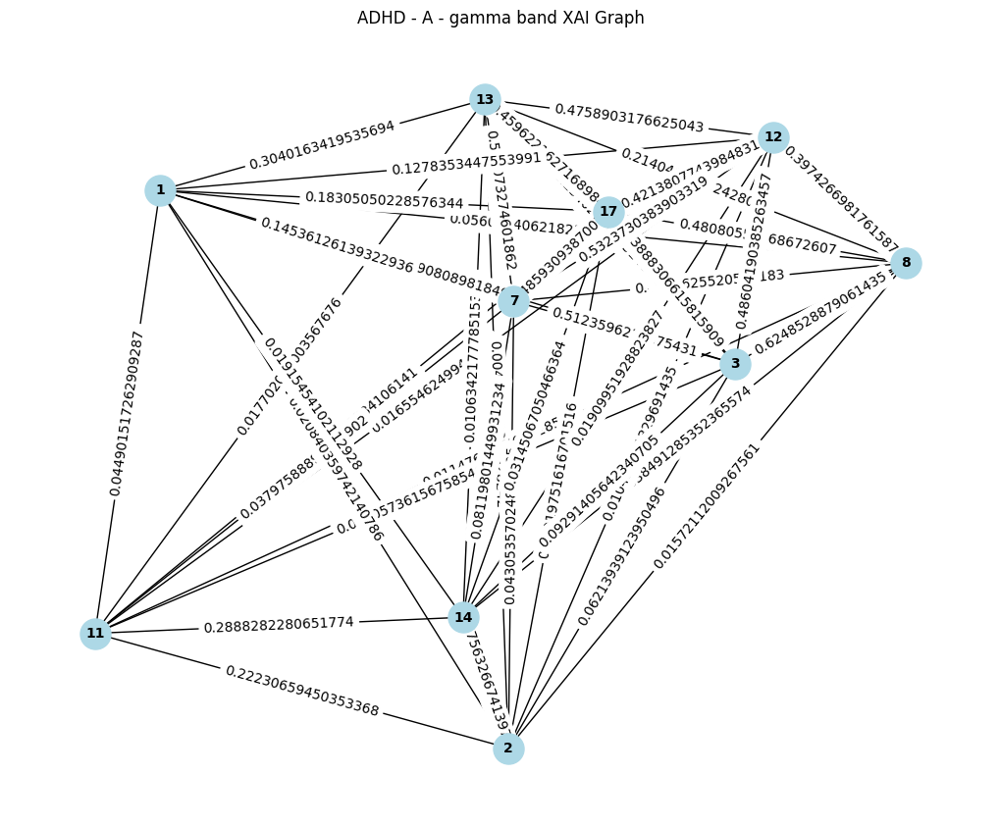

Combined data shape for ADHD, Emotion H: (476160, 60)


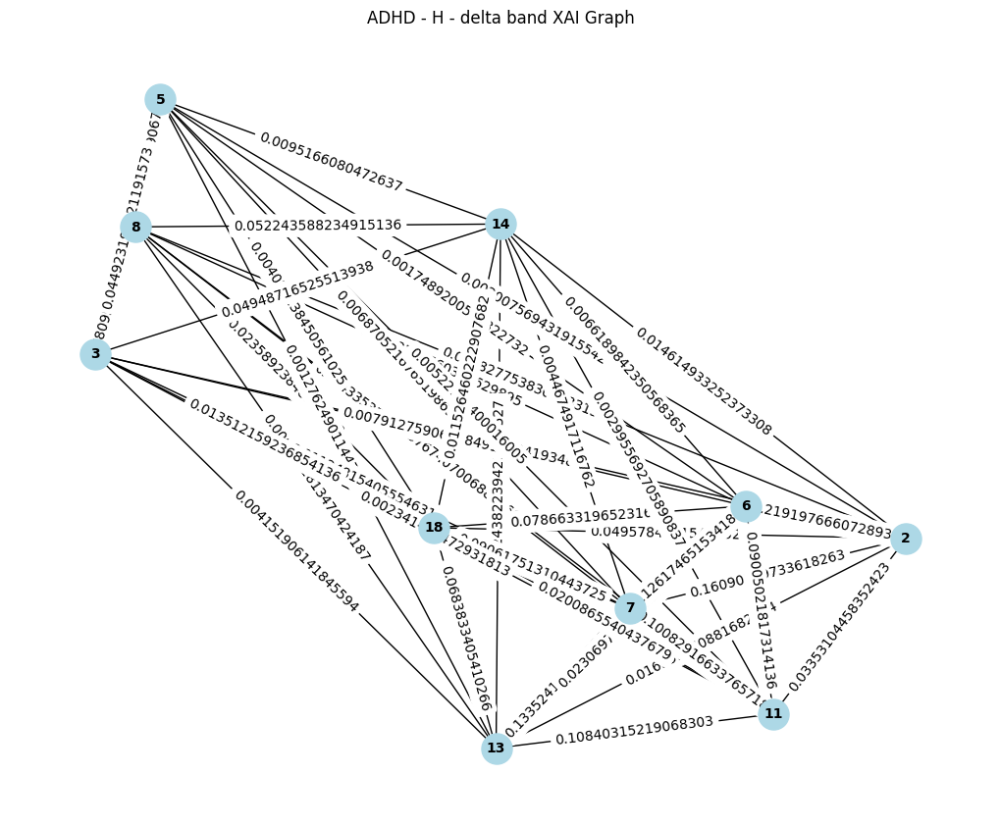

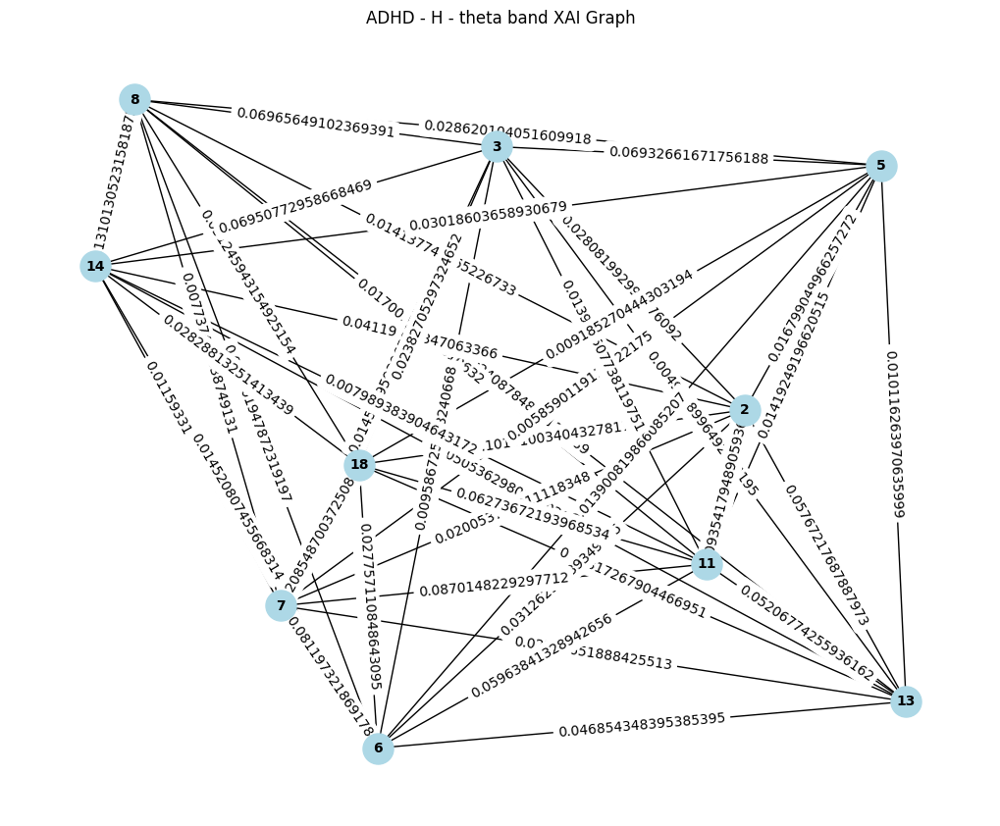

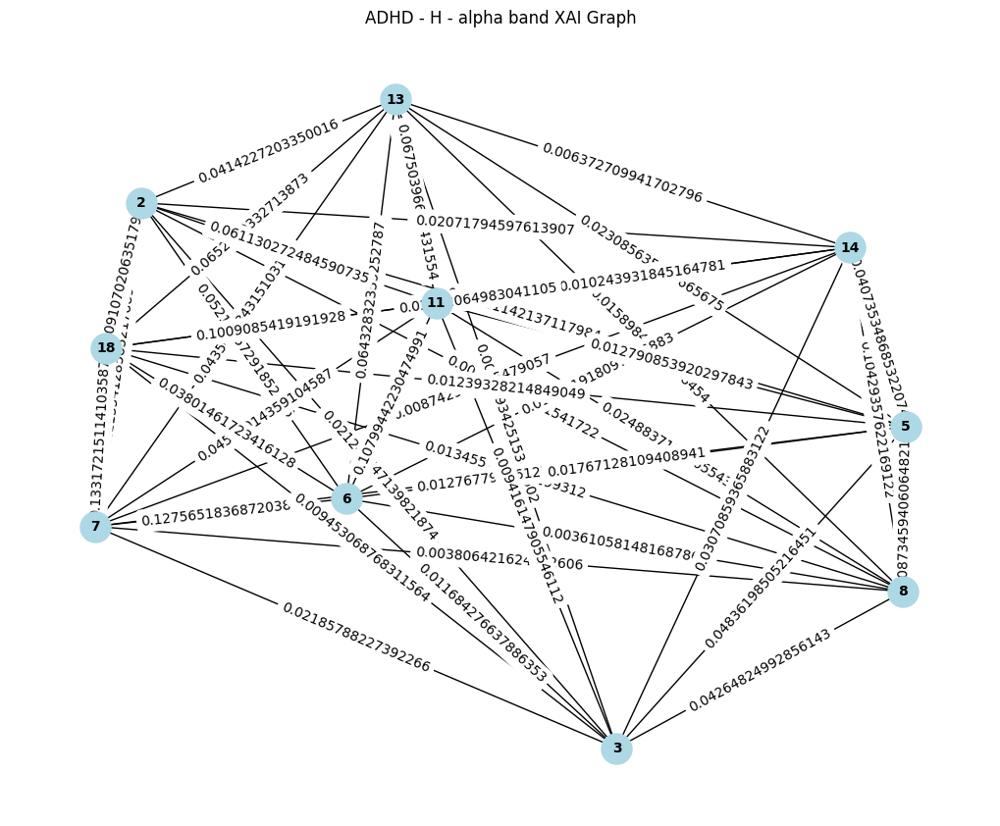

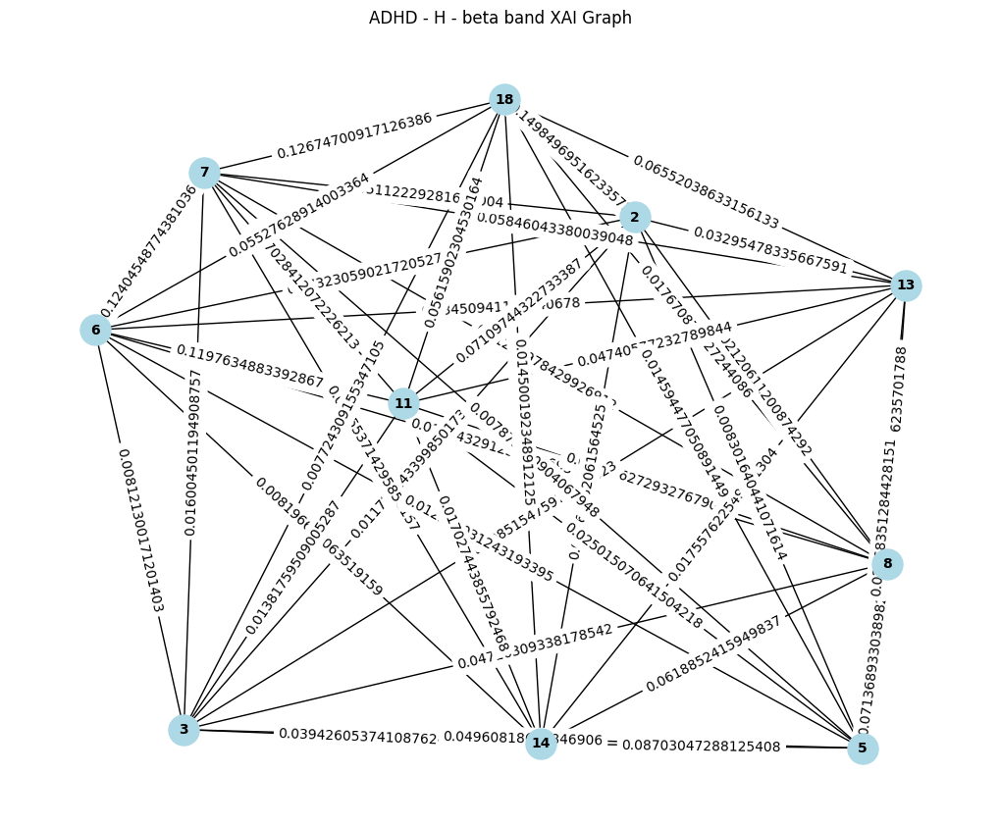

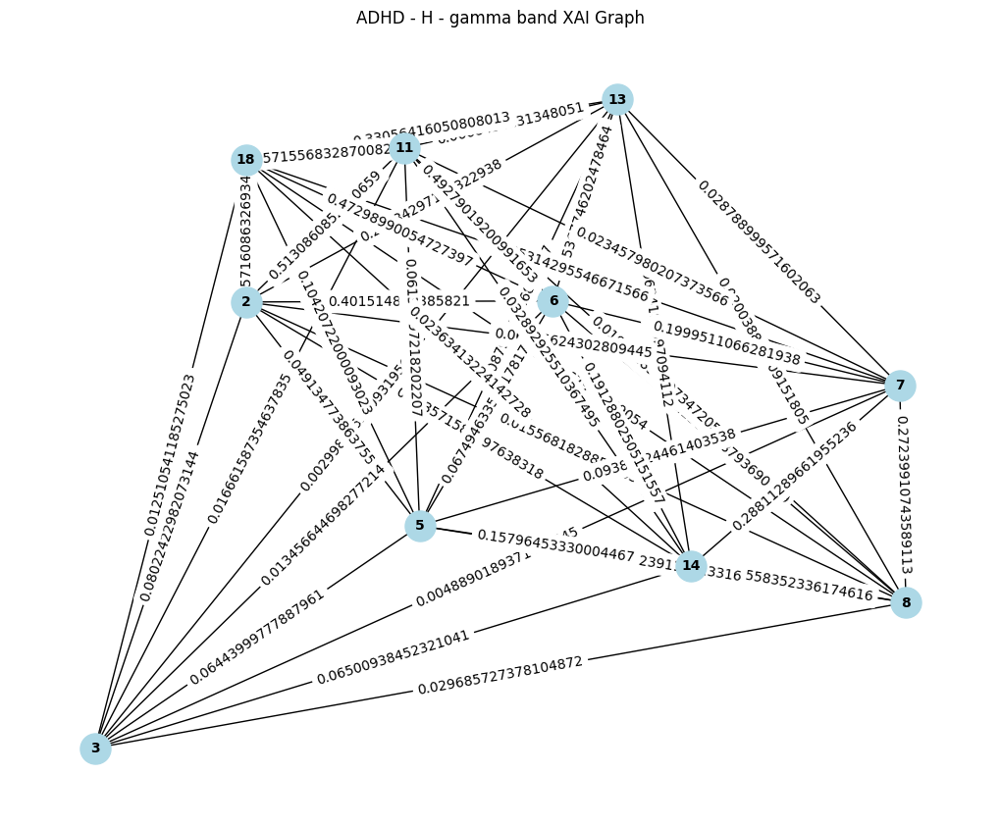

Combined data shape for ADHD, Emotion N: (476160, 60)


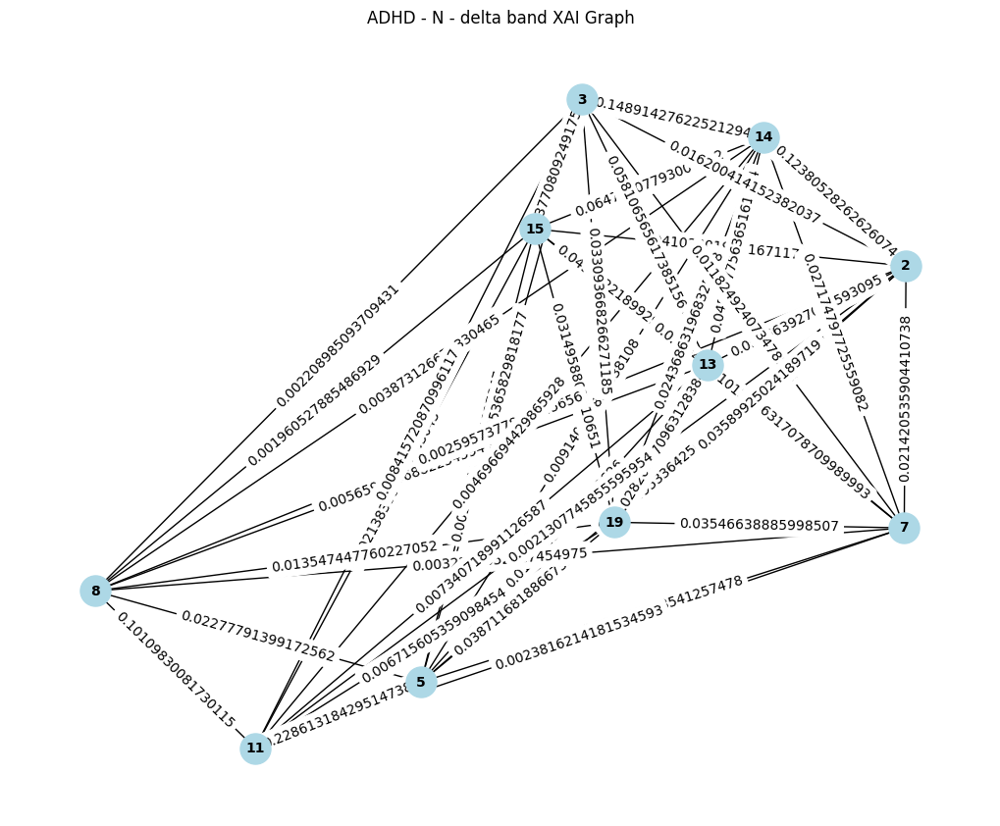

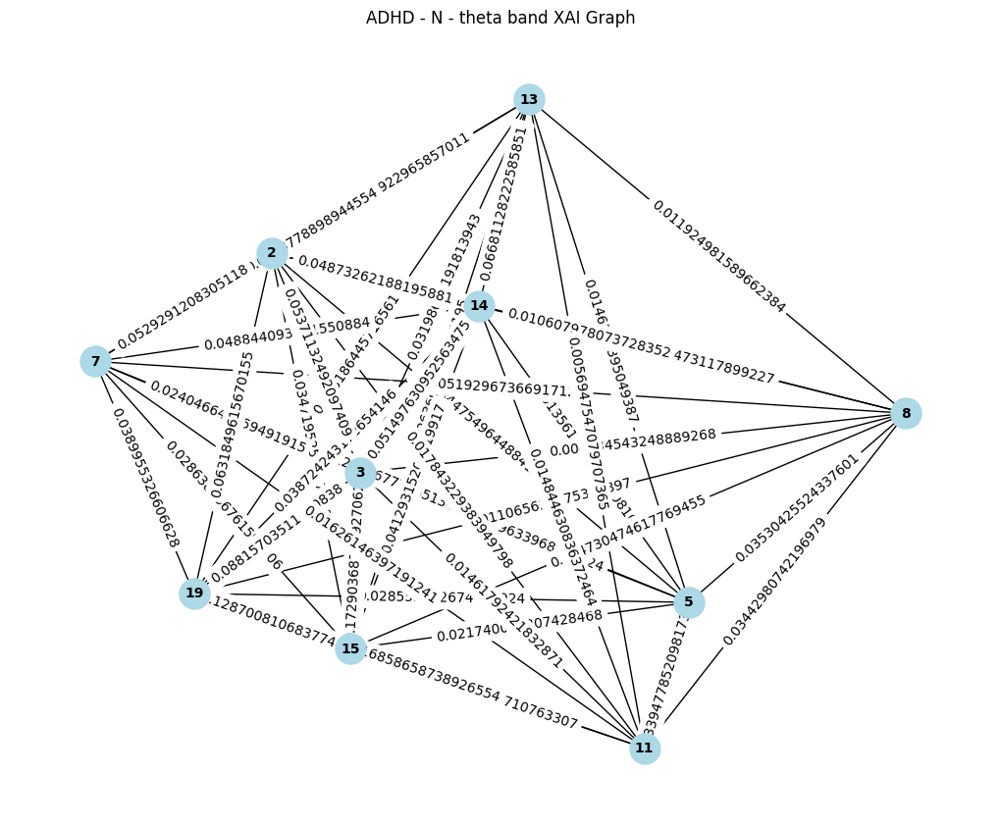

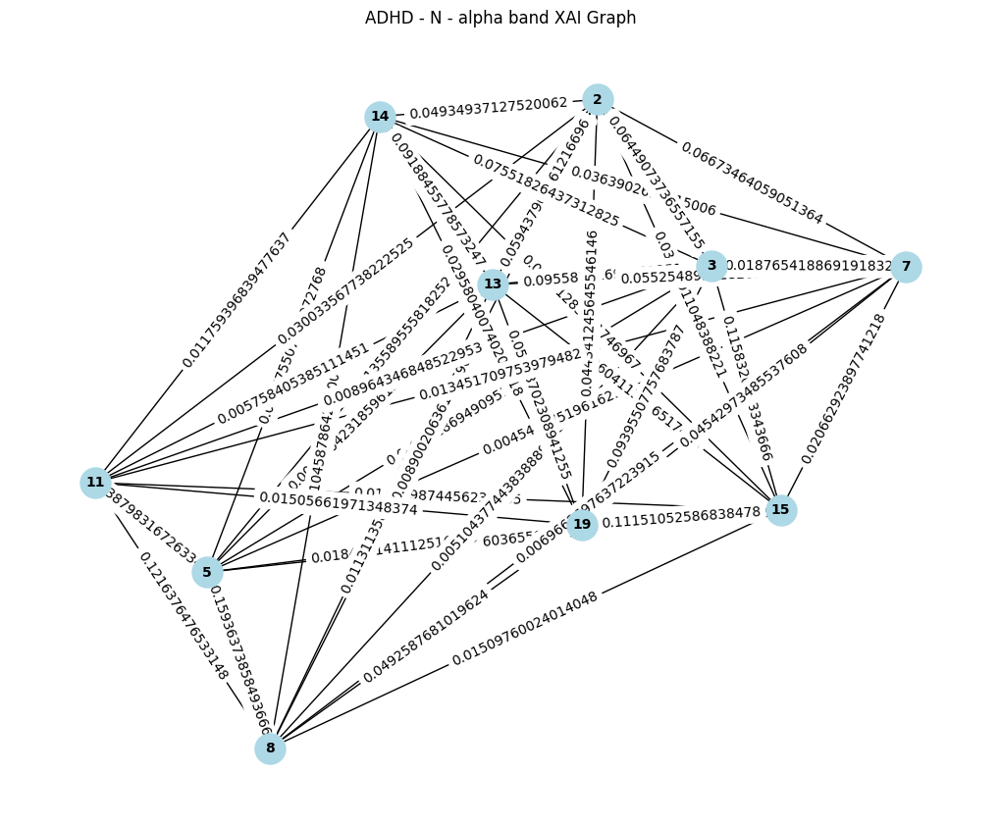

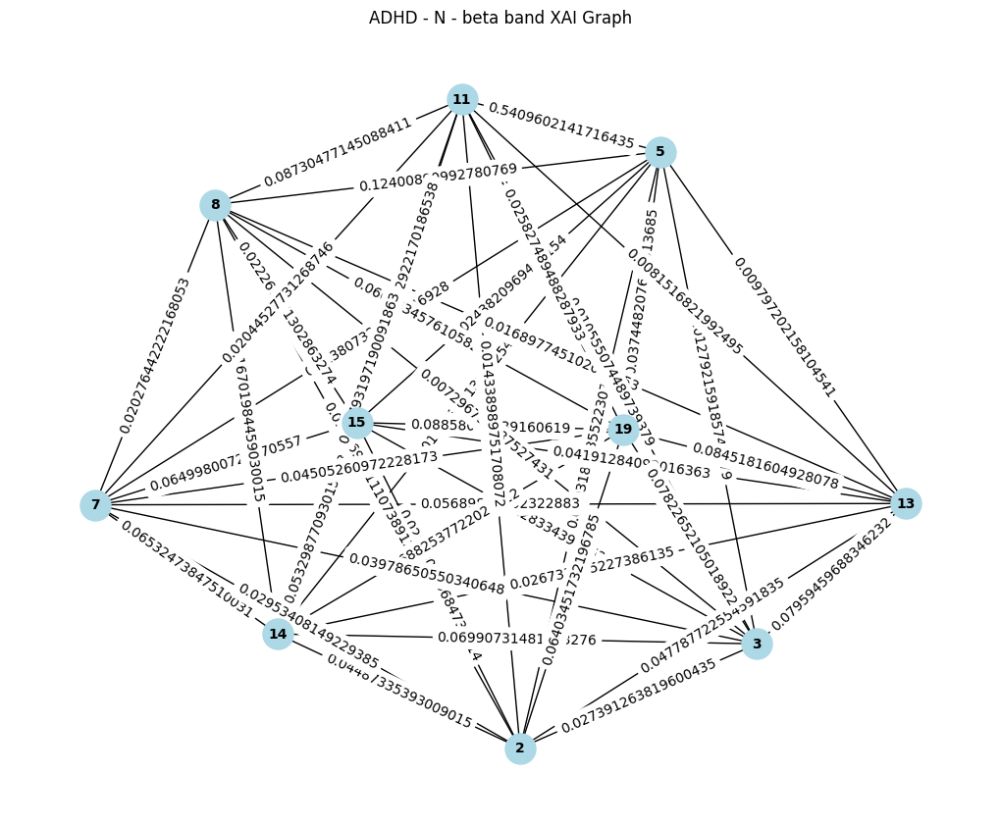

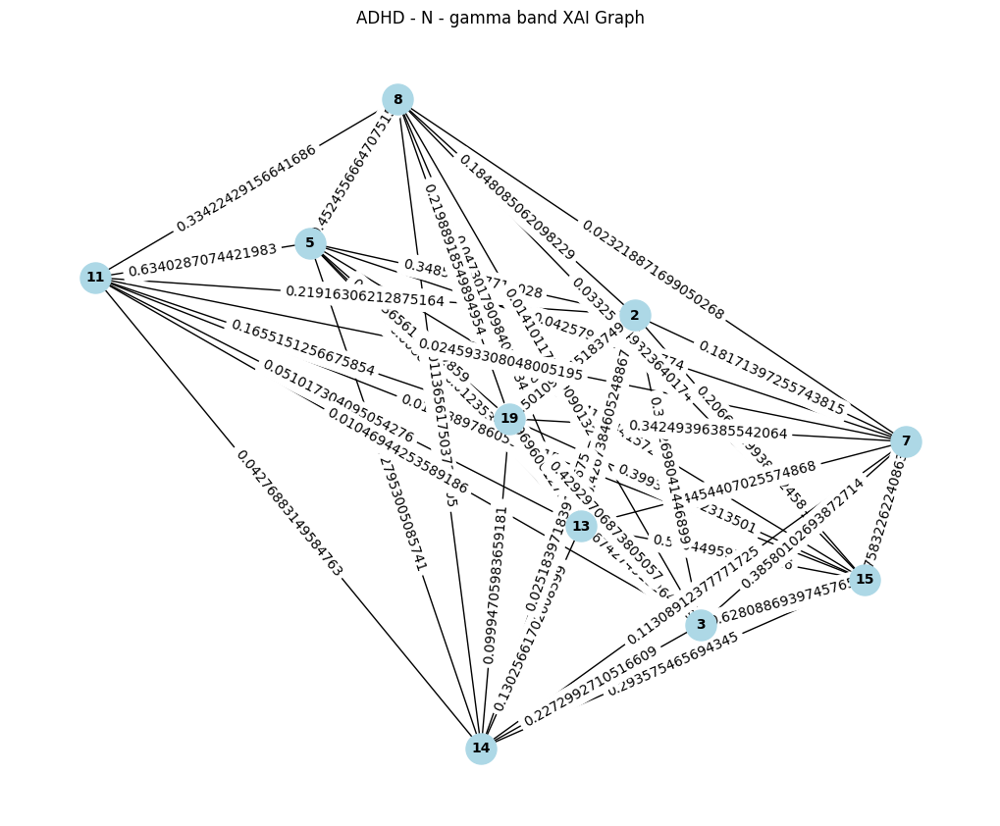

Combined data shape for ADHD, Emotion S: (476160, 60)


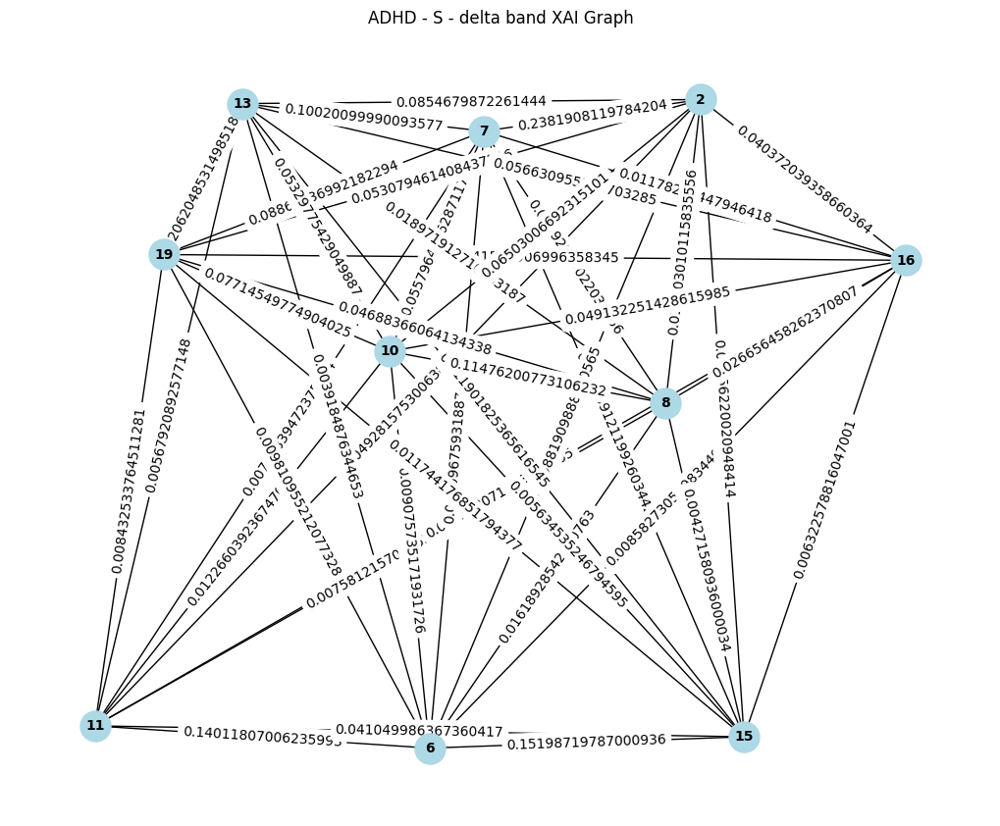

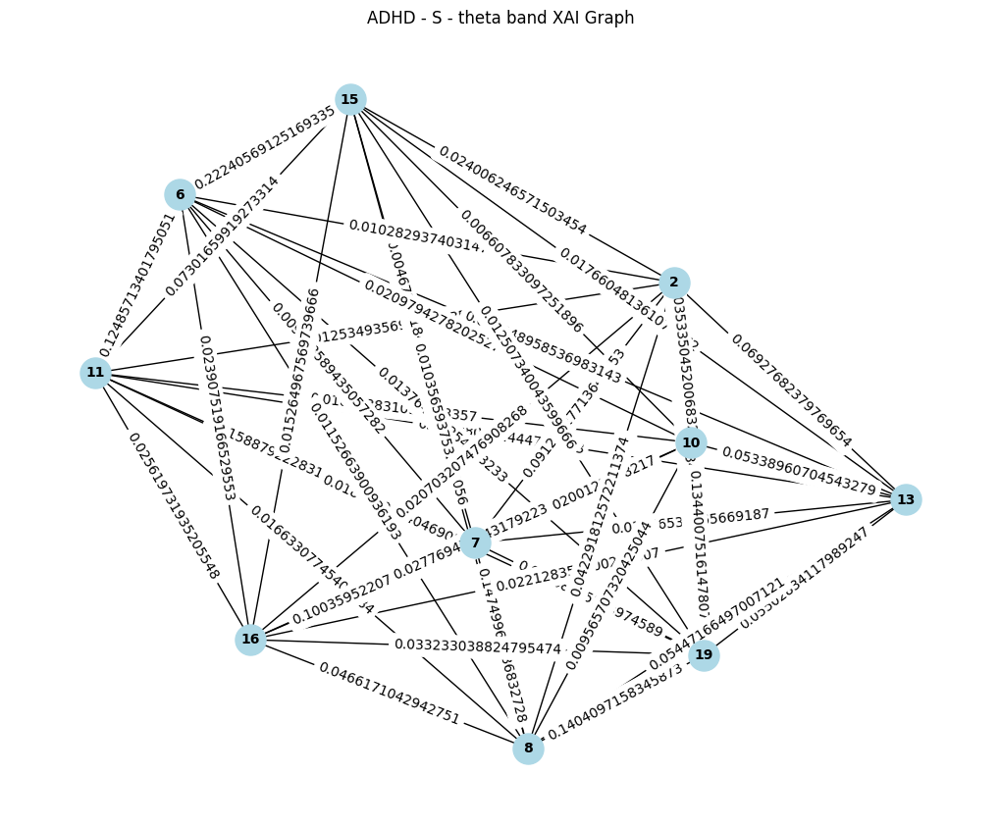

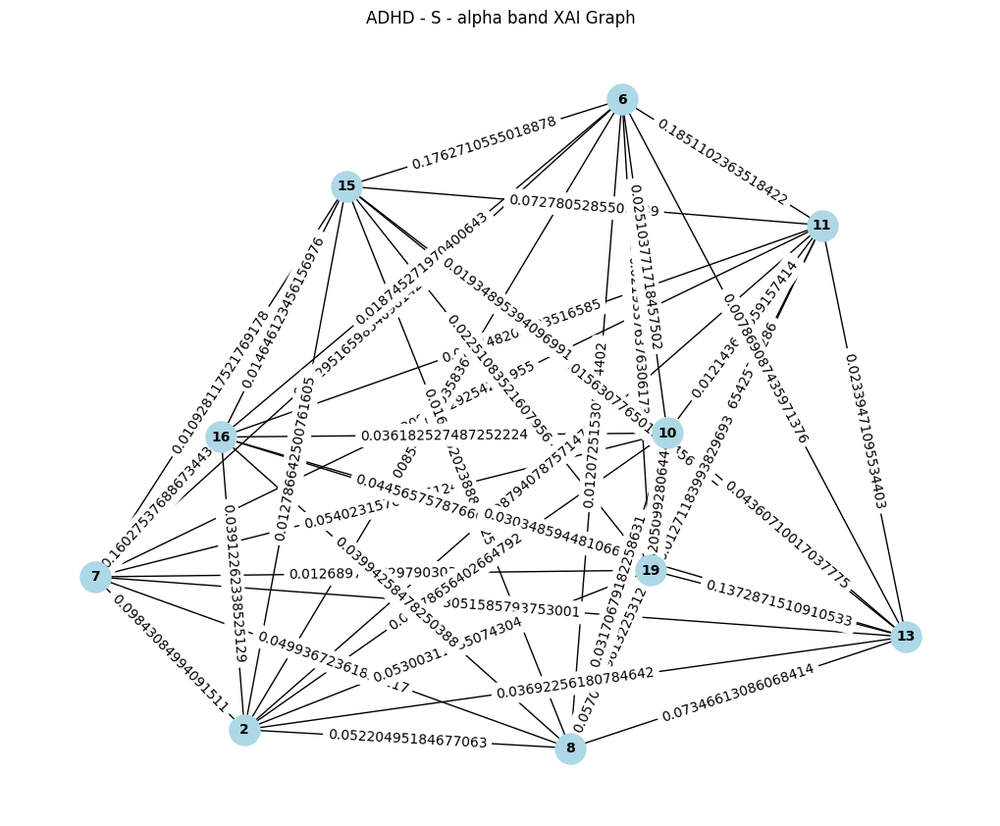

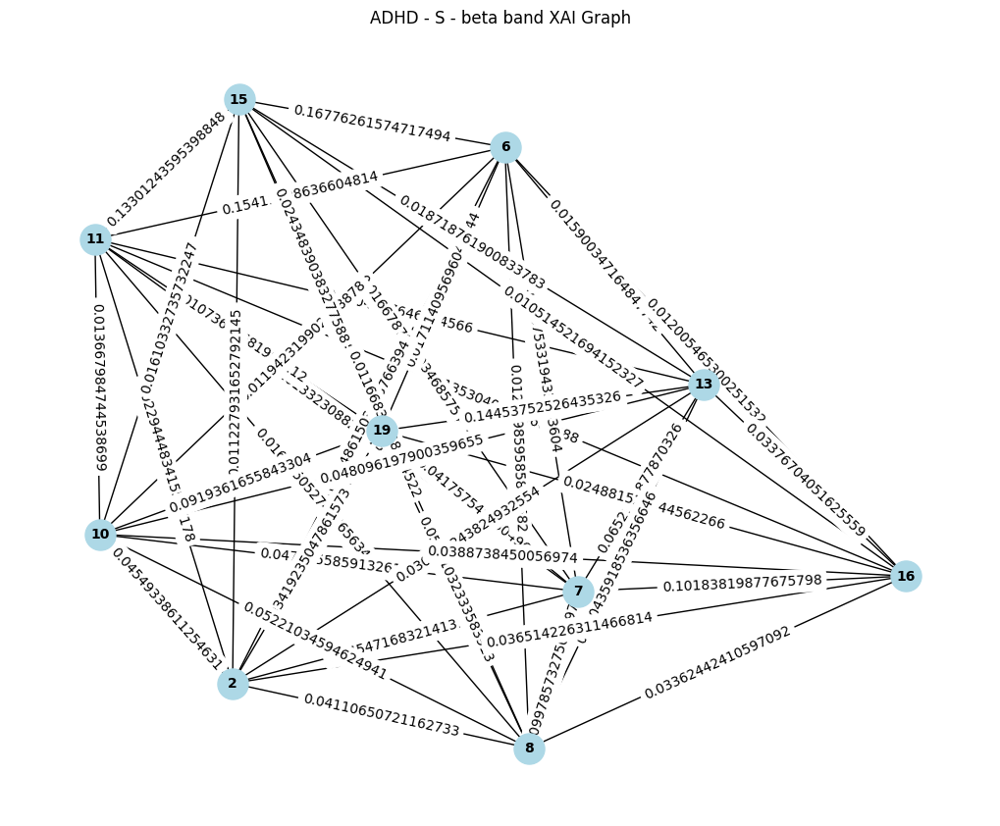

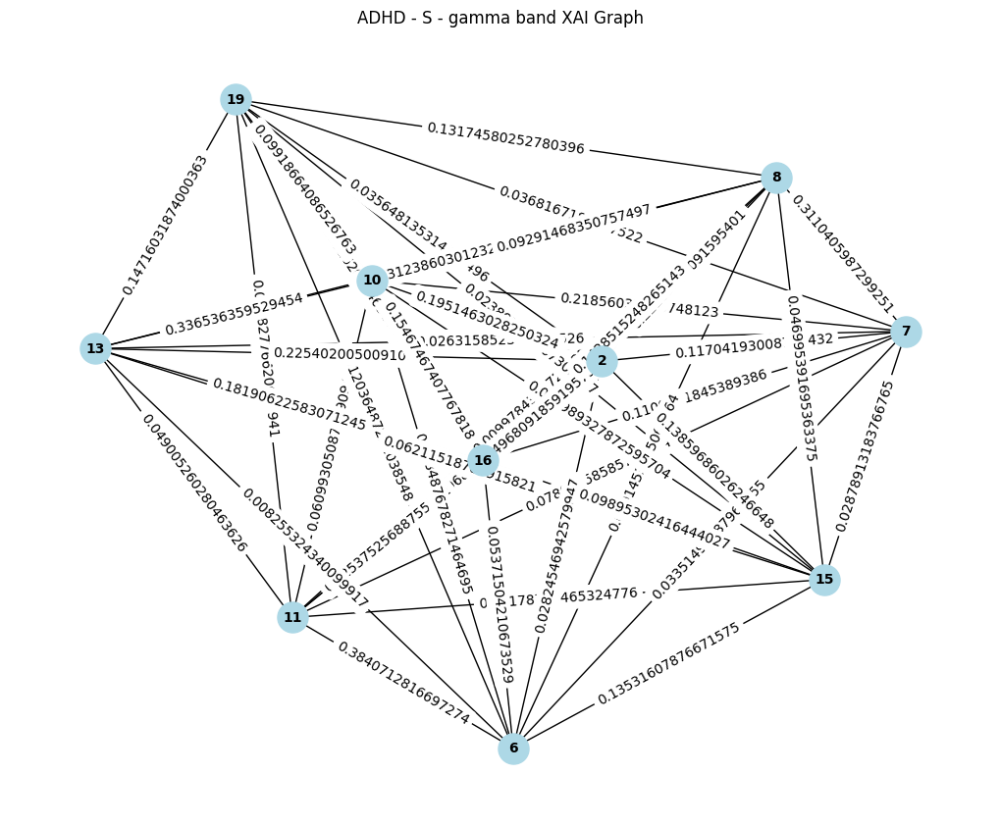


Processing Non-ADHD
Combined data shape for Non-ADHD, Emotion A: (474624, 60)


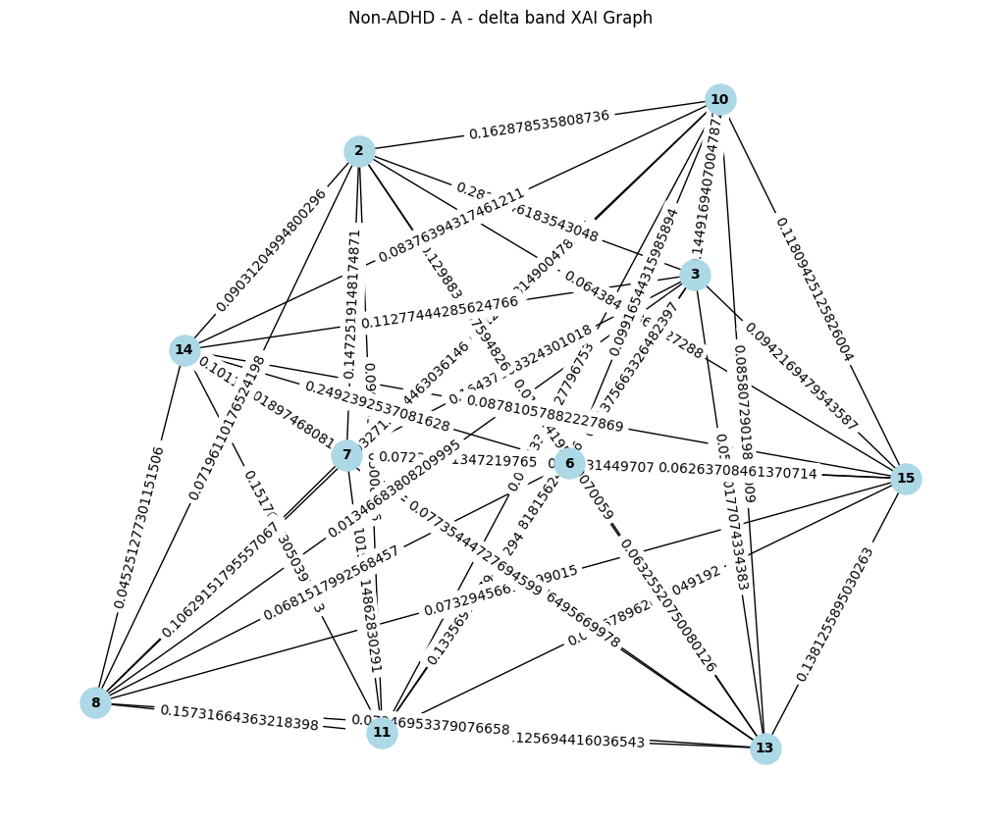

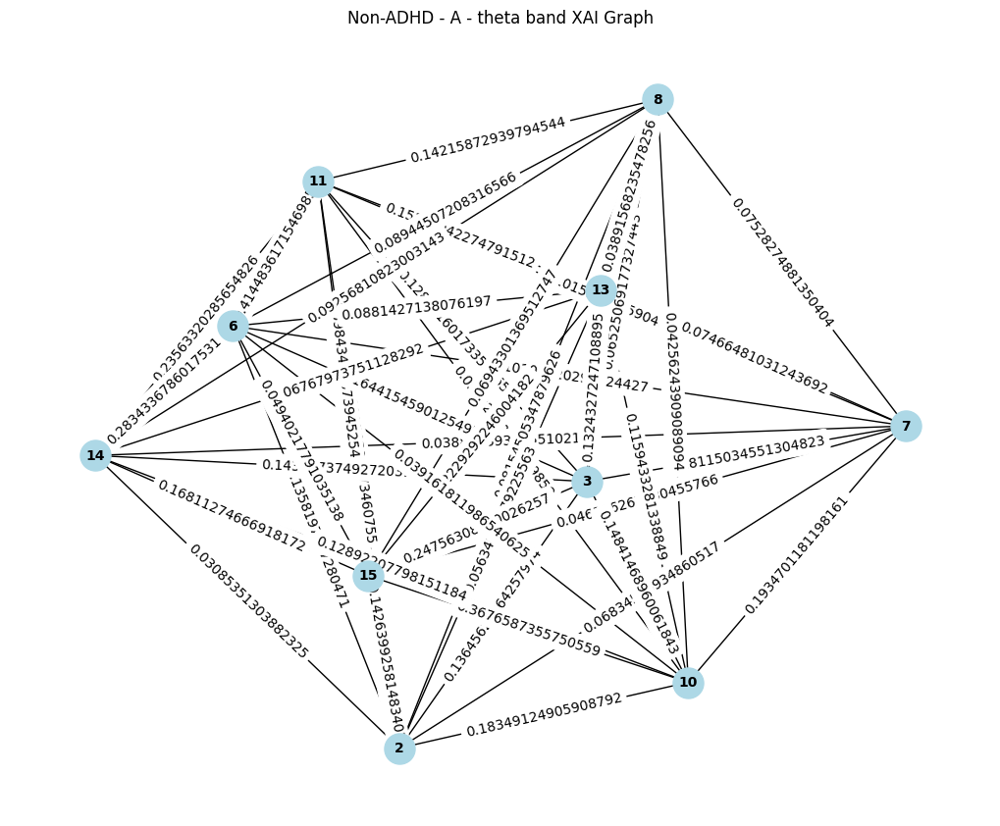

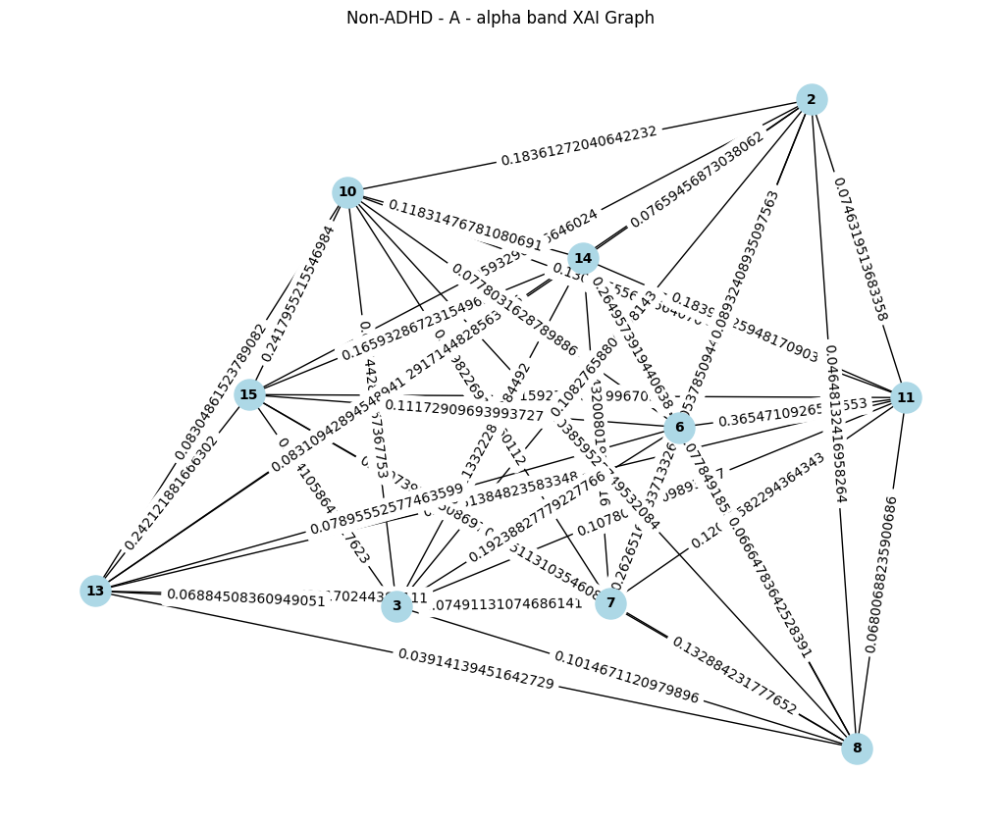

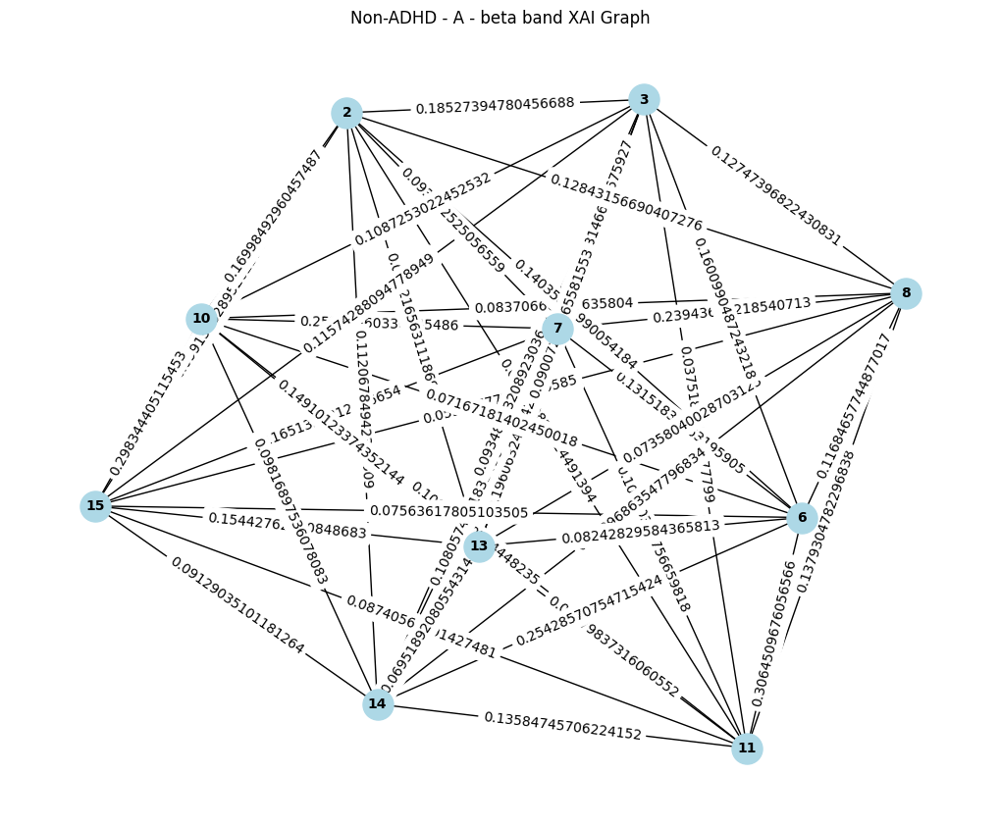

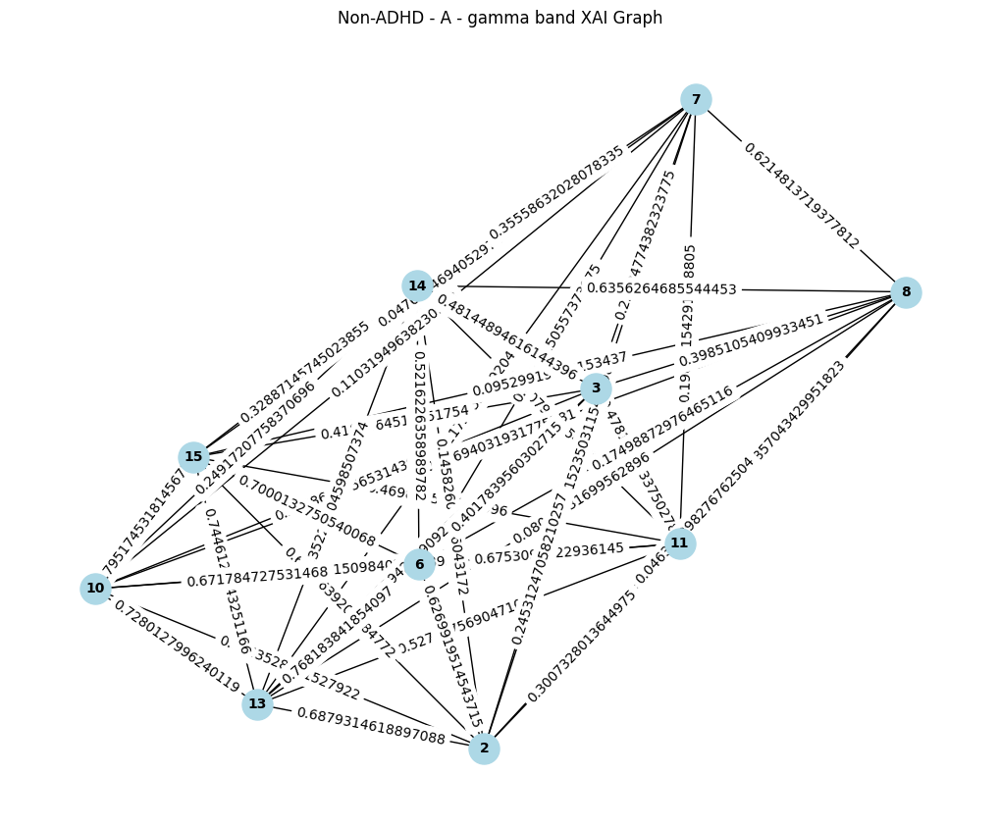

Combined data shape for Non-ADHD, Emotion H: (474624, 60)


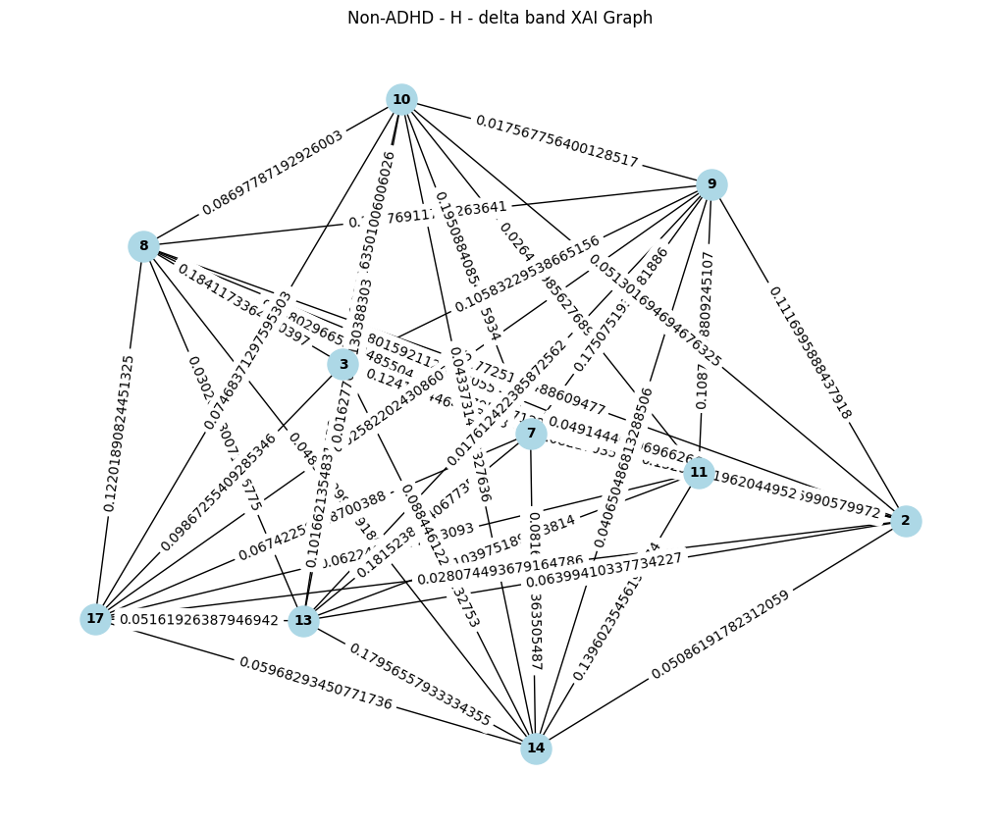

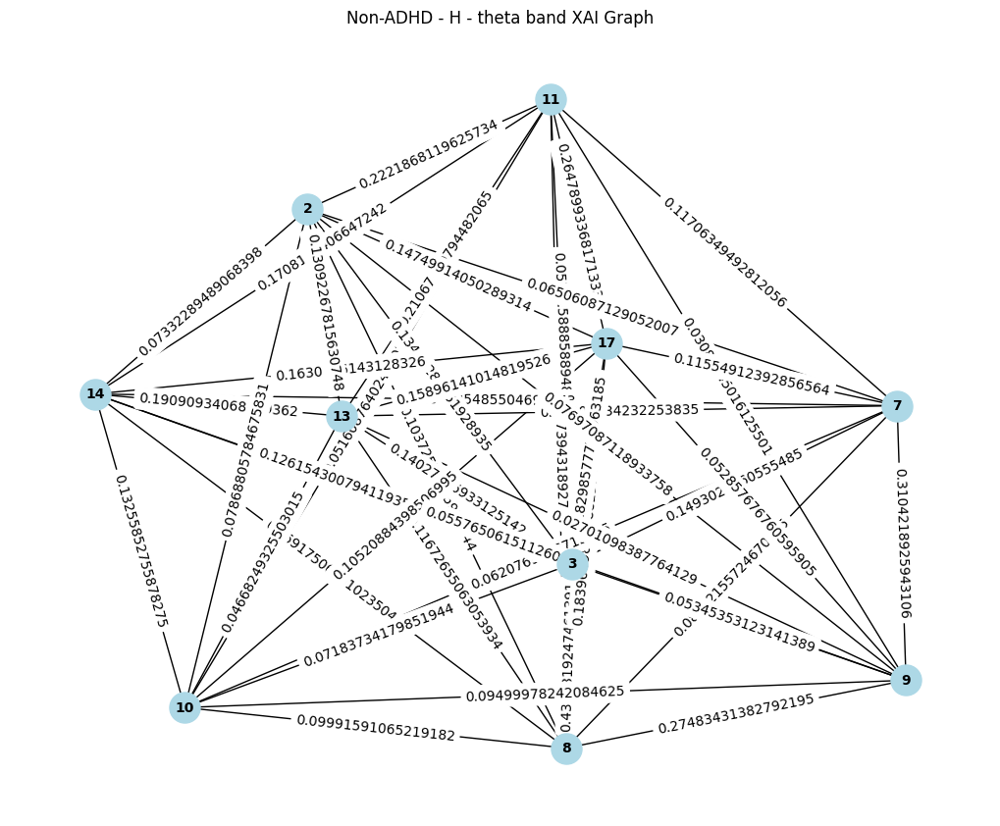

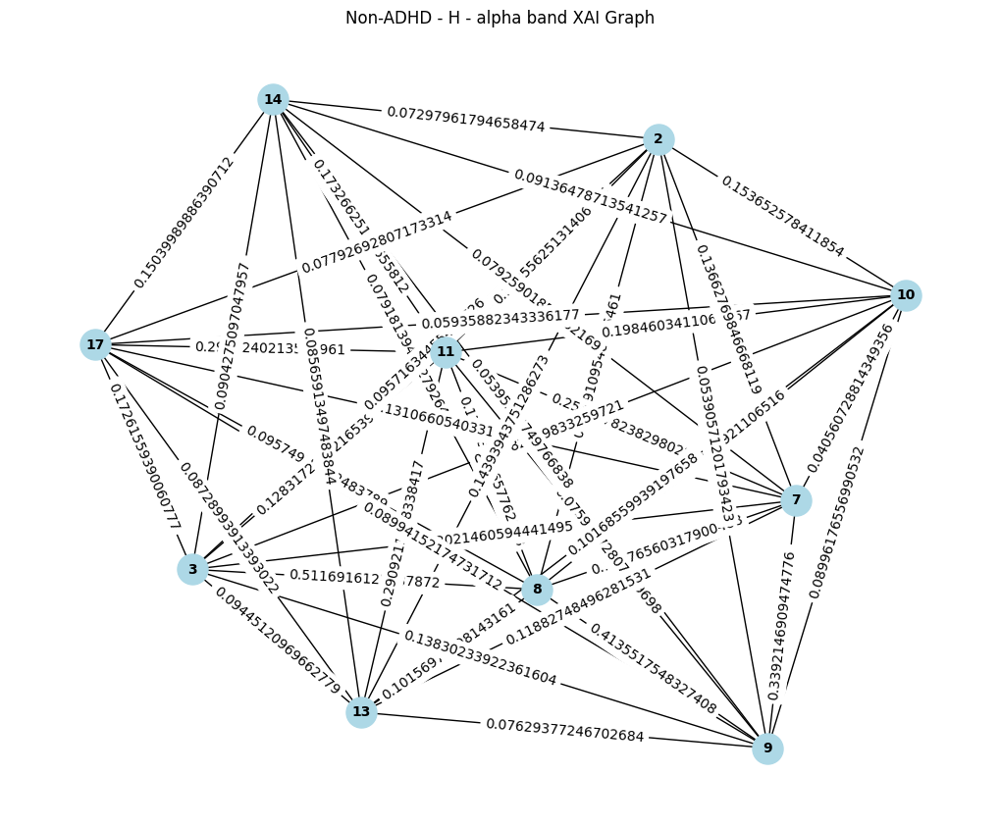

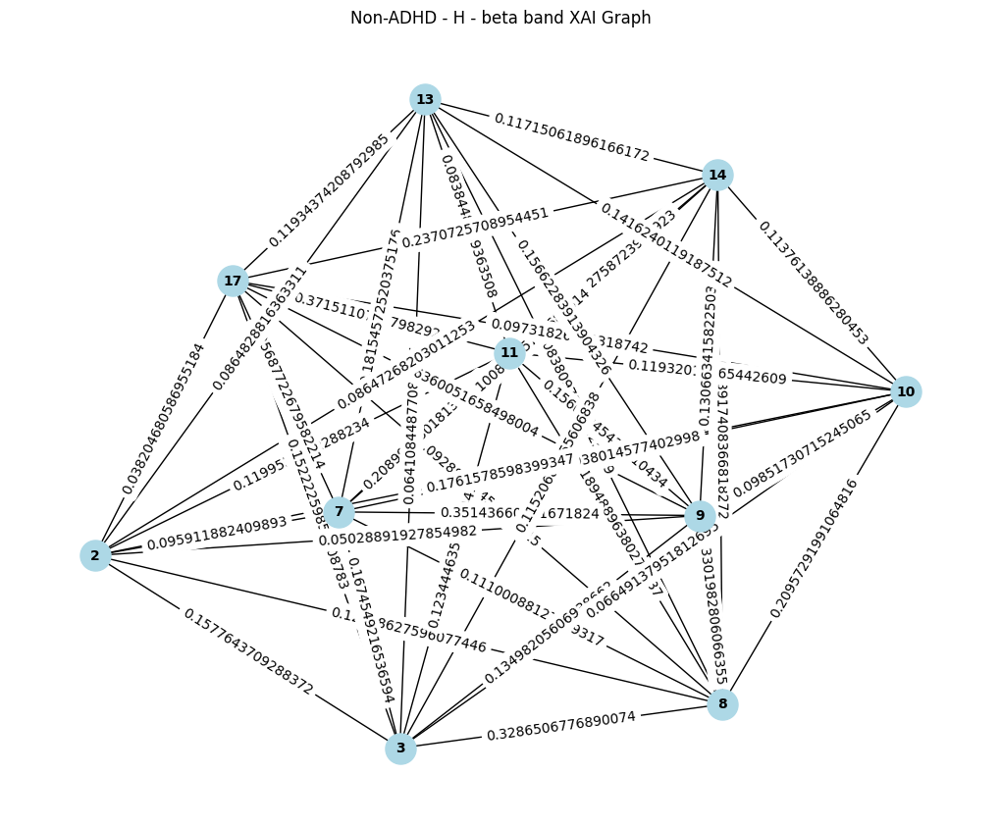

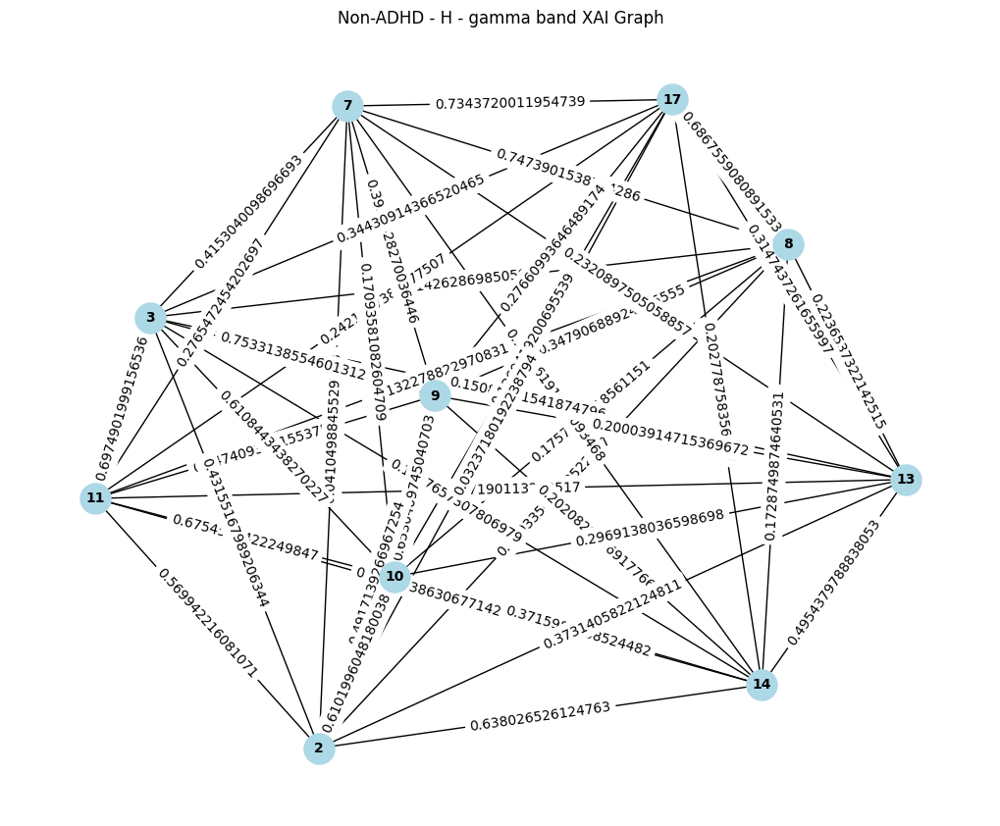

Combined data shape for Non-ADHD, Emotion N: (474624, 60)


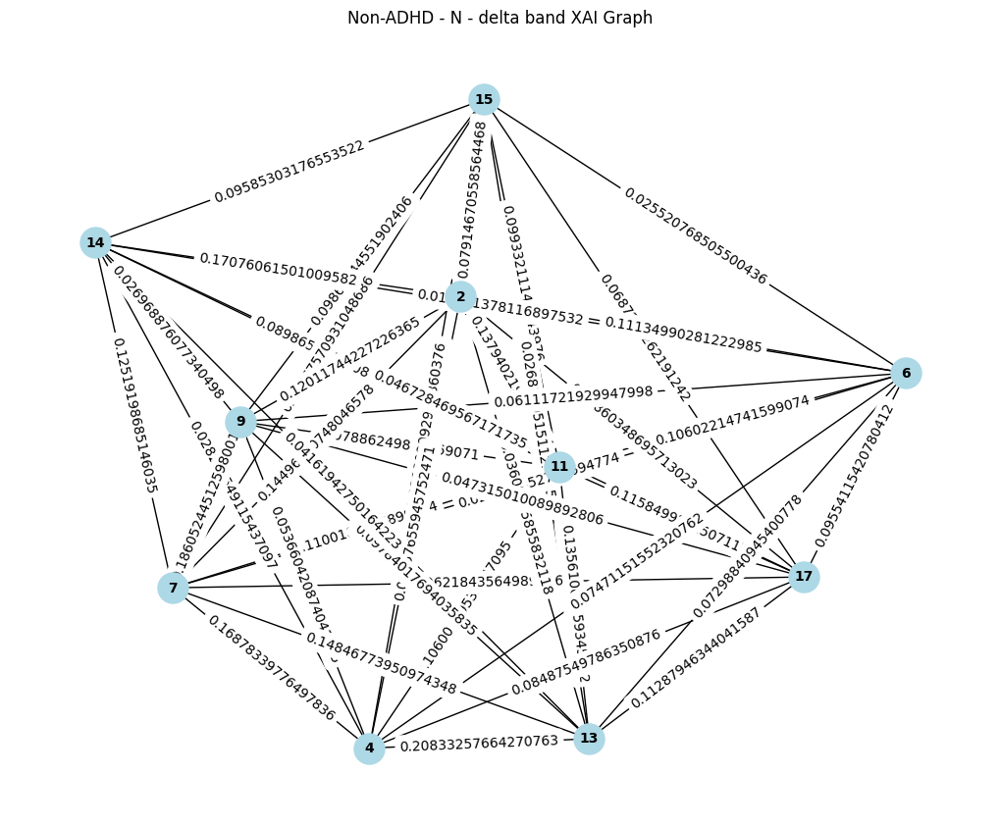

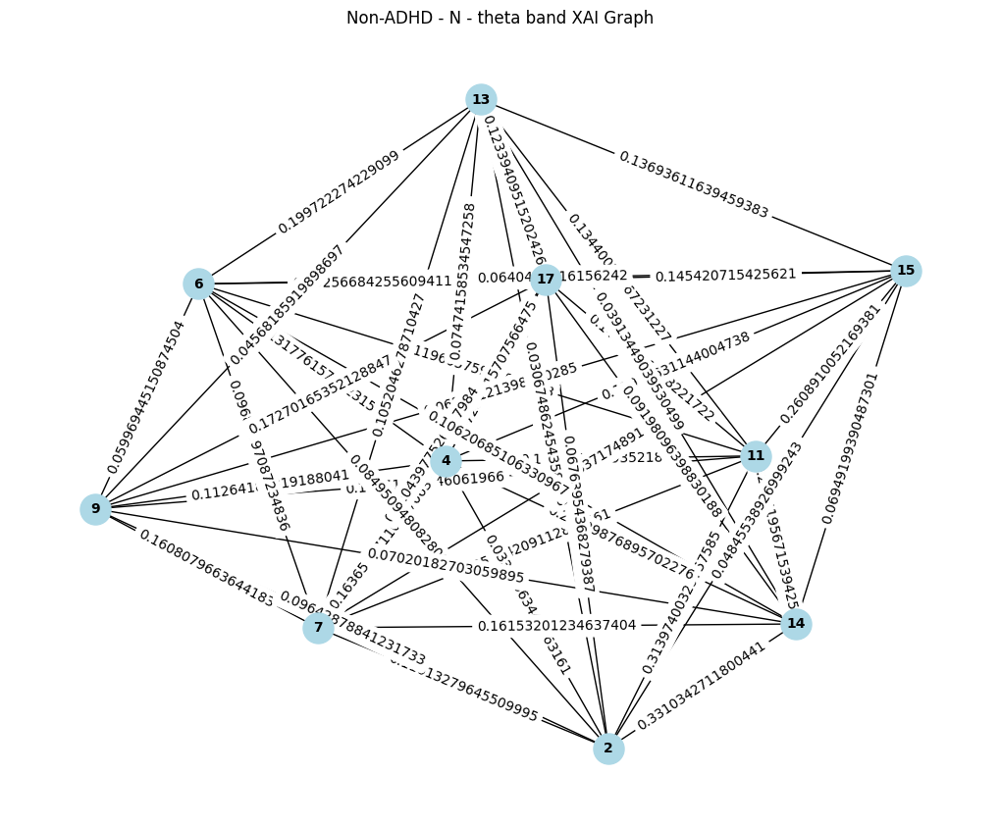

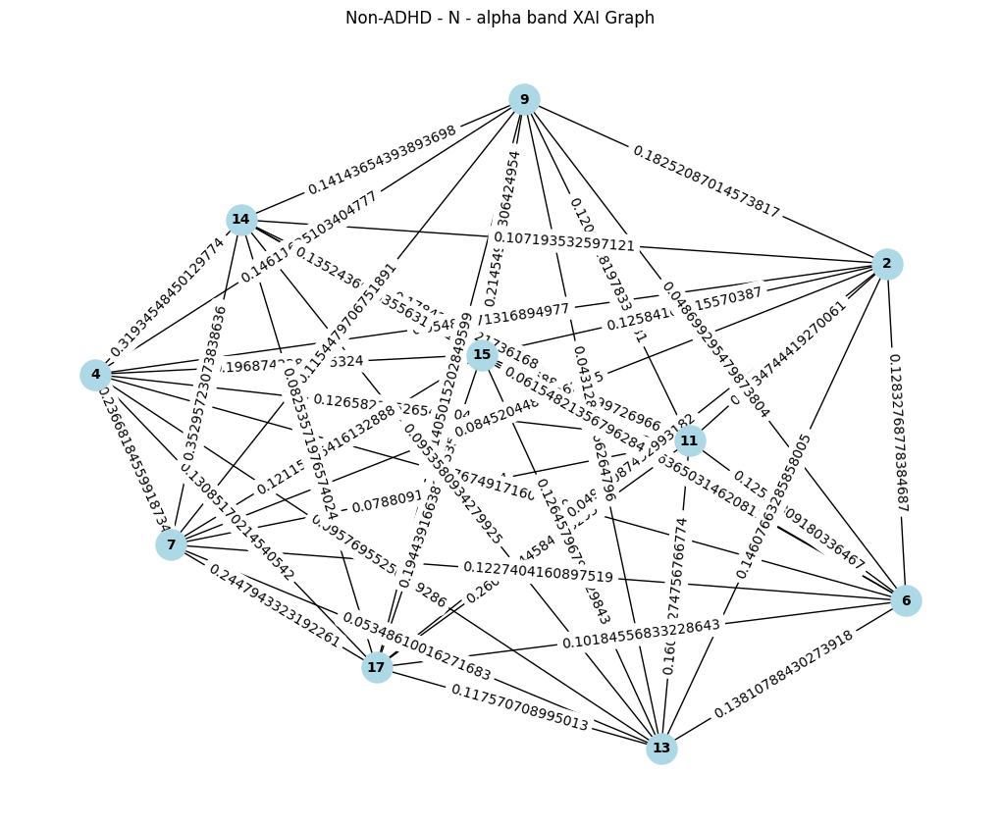

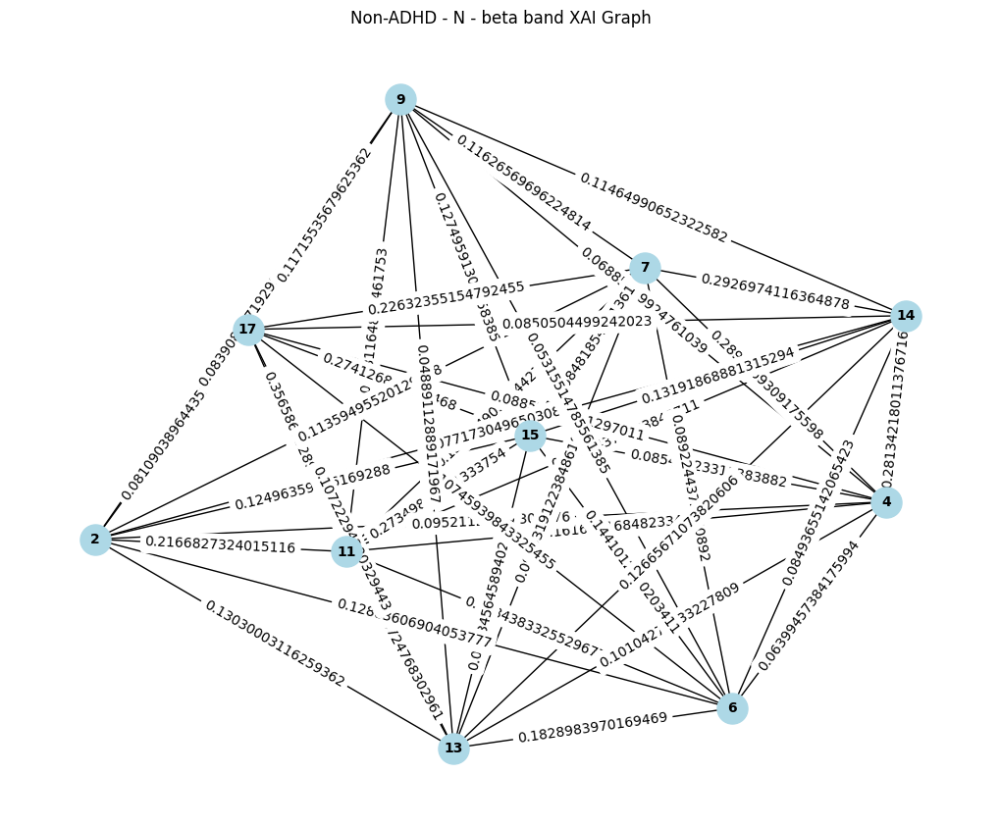

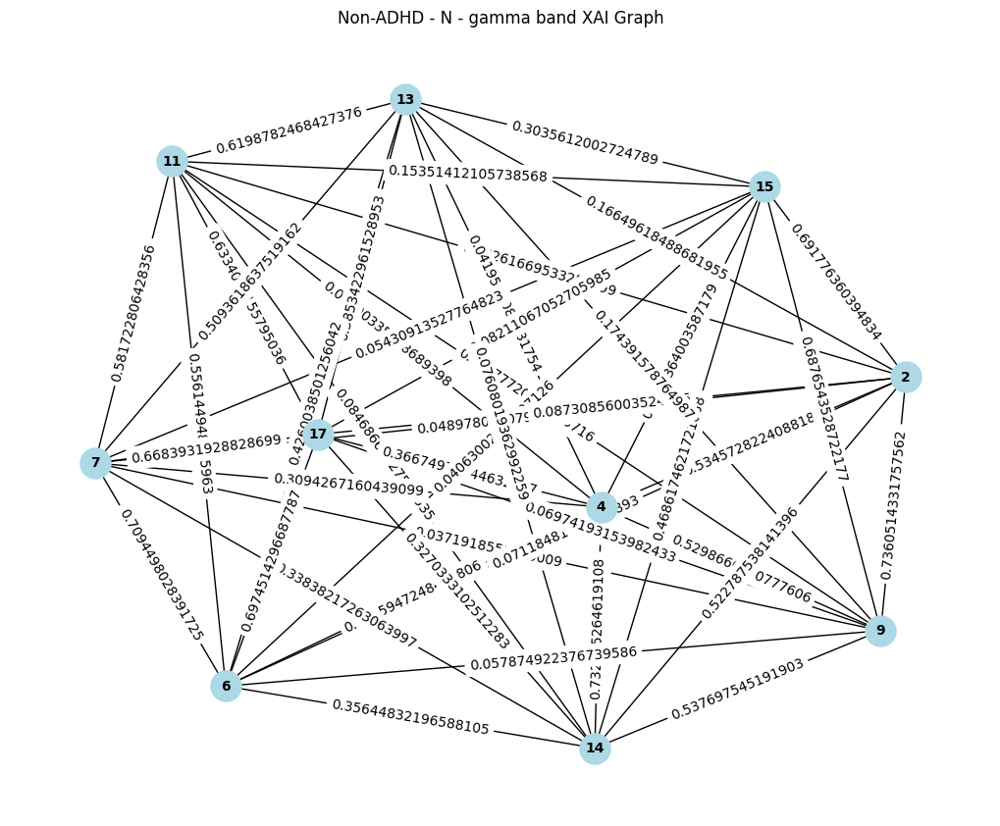

Combined data shape for Non-ADHD, Emotion S: (474624, 60)


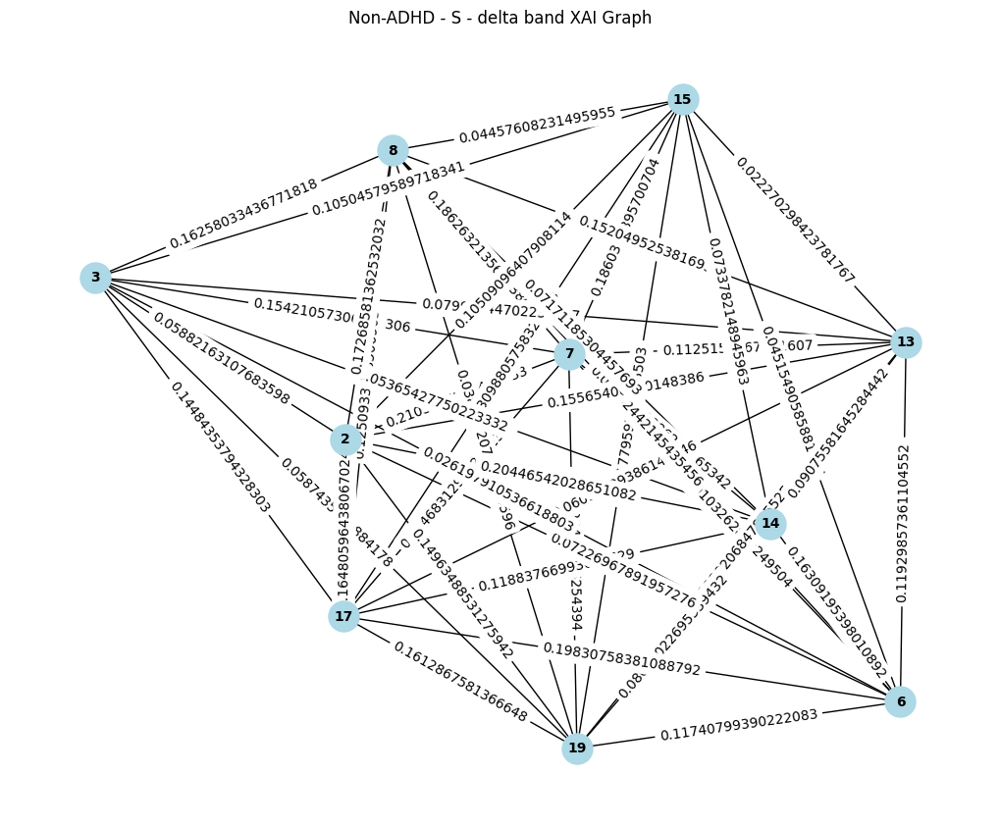

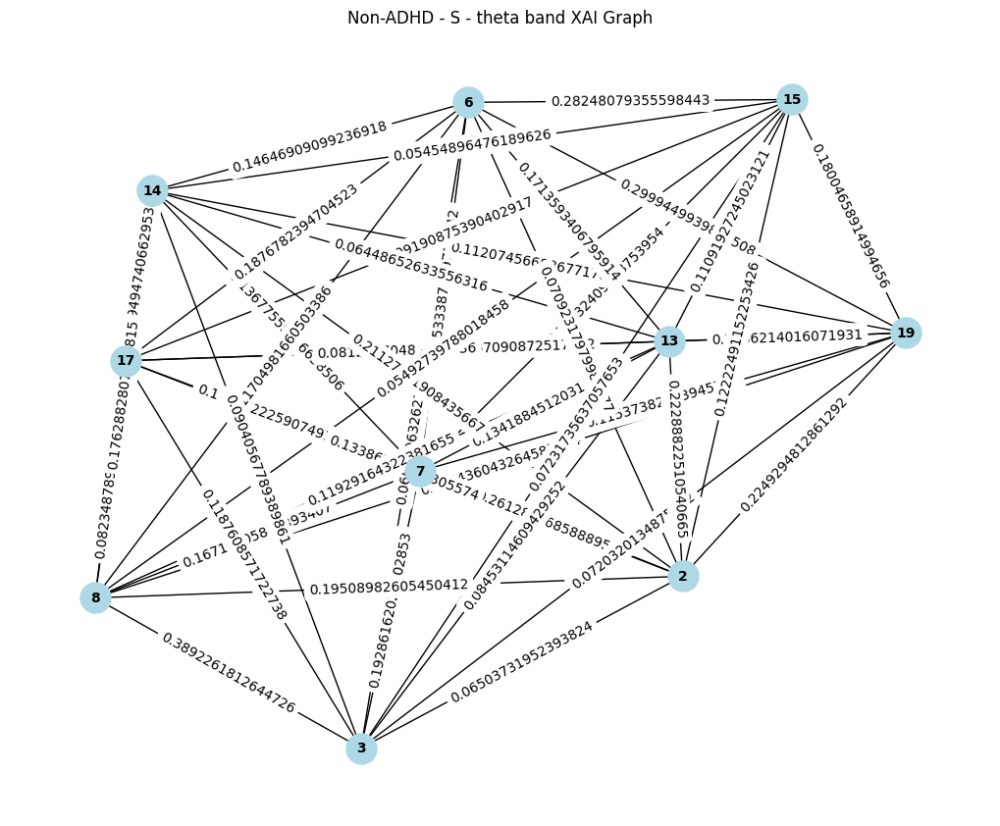

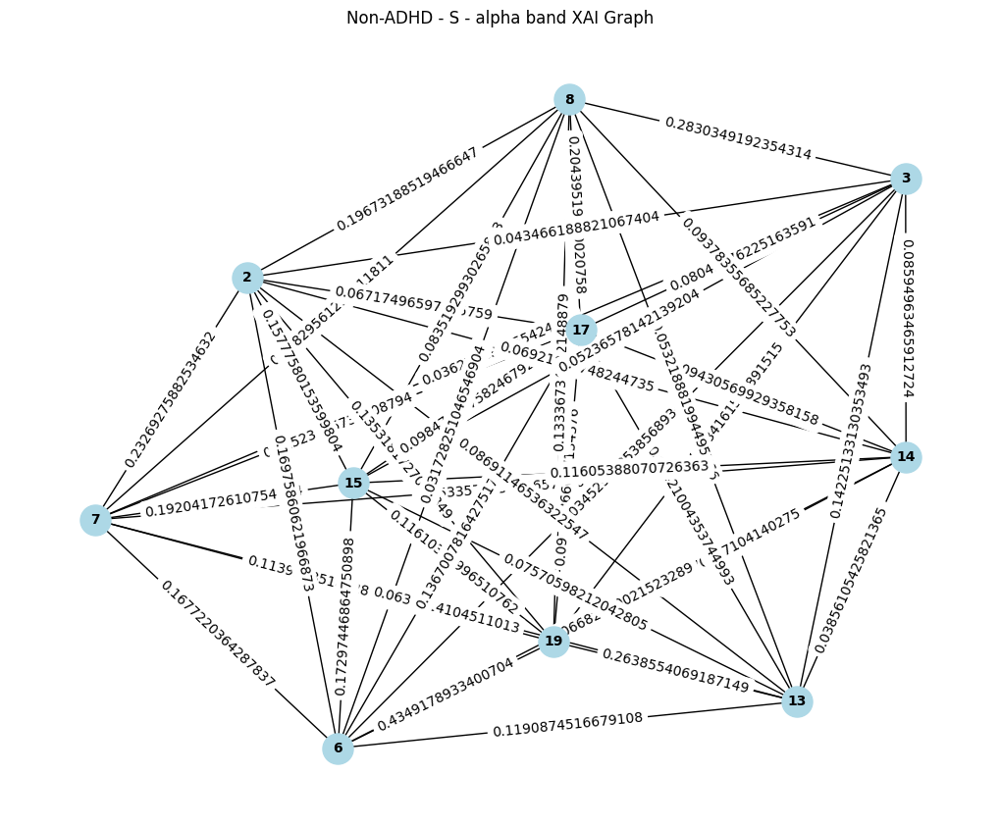

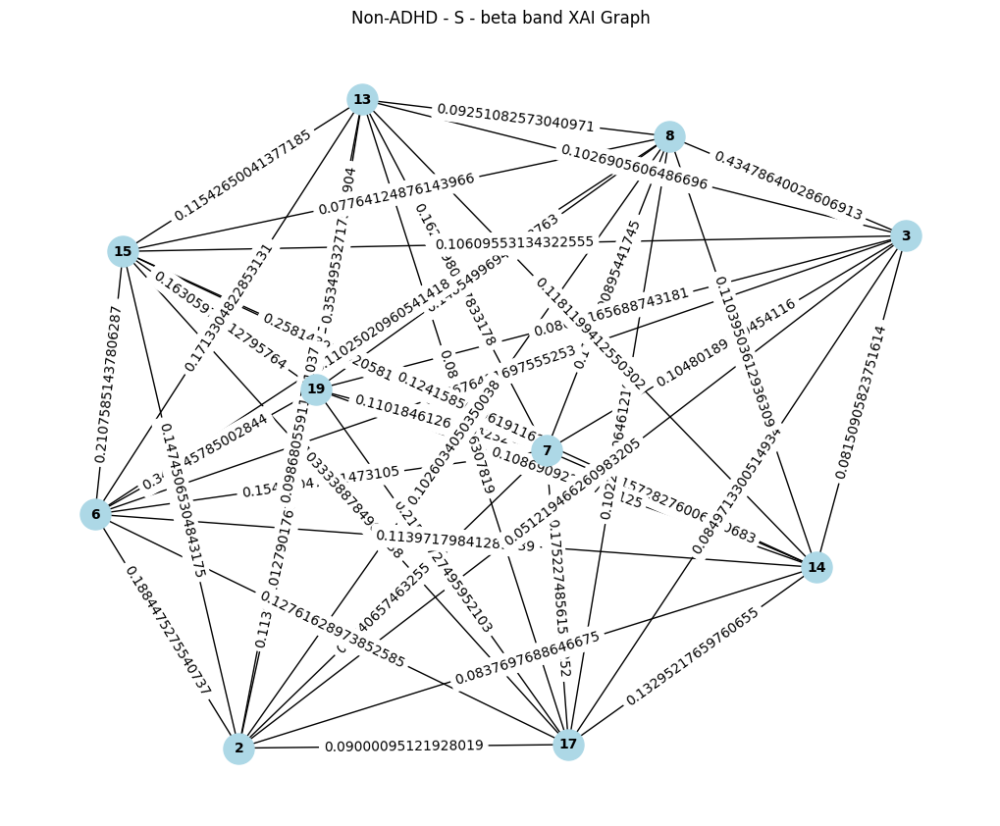

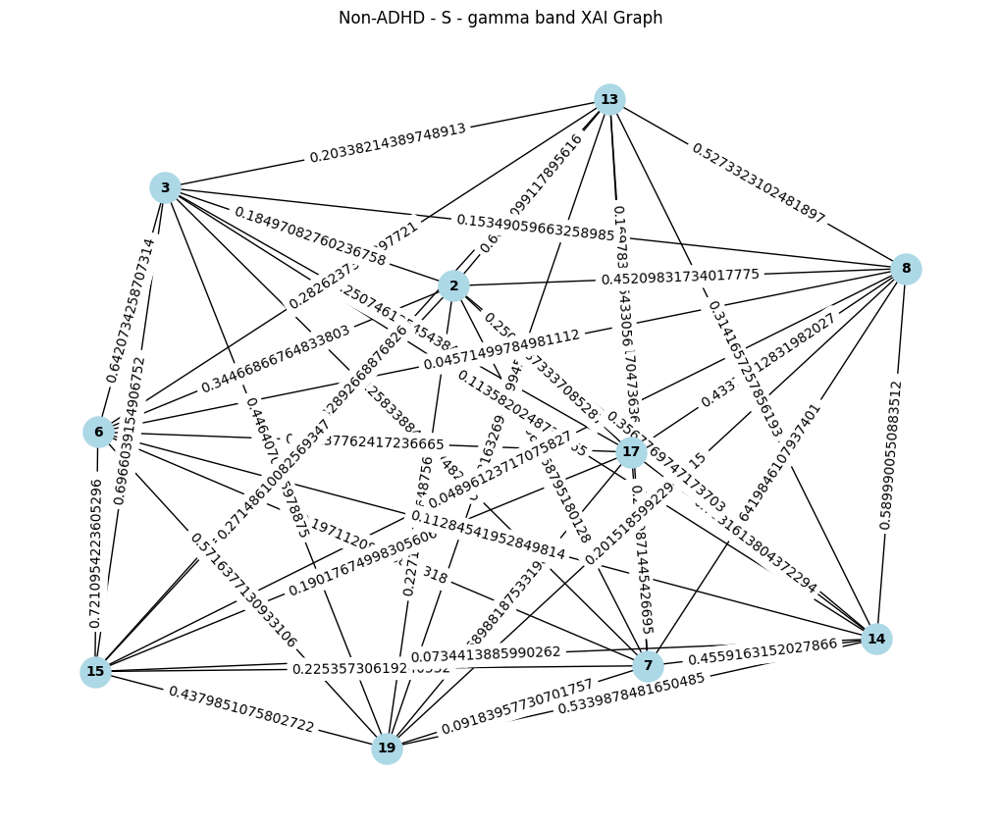


Graph distances between ADHD and Non-ADHD:

Emotion: A
  delta band: 0.678929454453516
  theta band: 0.5967552488564535
  alpha band: 0.49855924885496133
  beta band: 0.5197158462208467
  gamma band: 2.357121931315977


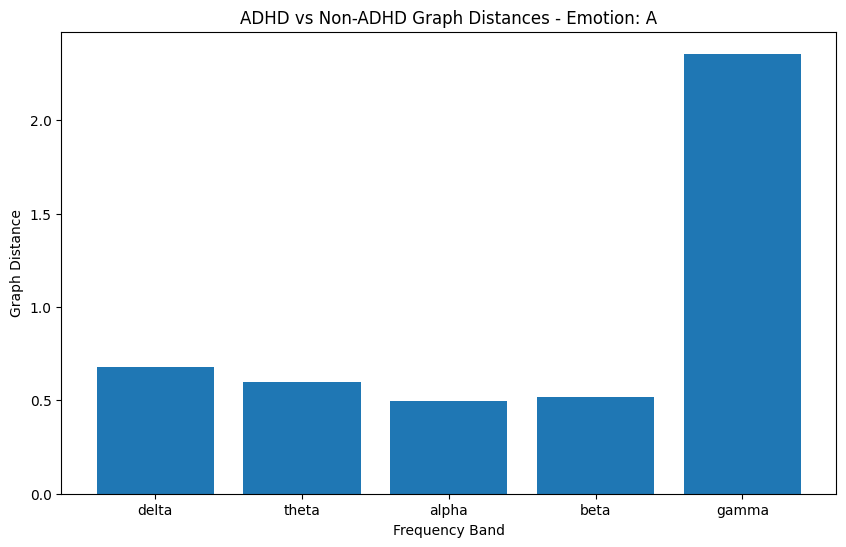


Emotion: H
  delta band: 0.5601772214209115
  theta band: 0.8388852559761147
  alpha band: 0.9684214516358516
  beta band: 0.7594797721430561
  gamma band: 2.0734100332553917


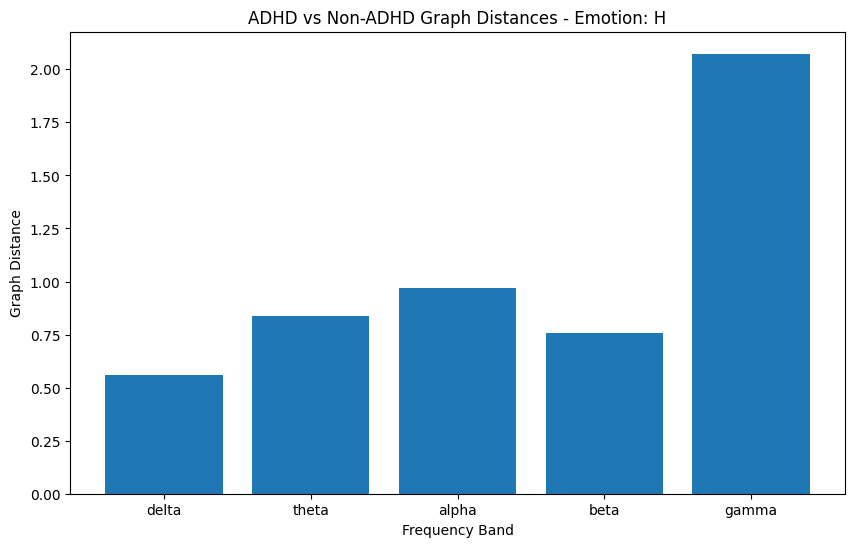


Emotion: N
  delta band: 0.45102224445861844
  theta band: 0.8193086965756408
  alpha band: 0.875180780666652
  beta band: 0.6806765041542306
  gamma band: 1.7173609107515353


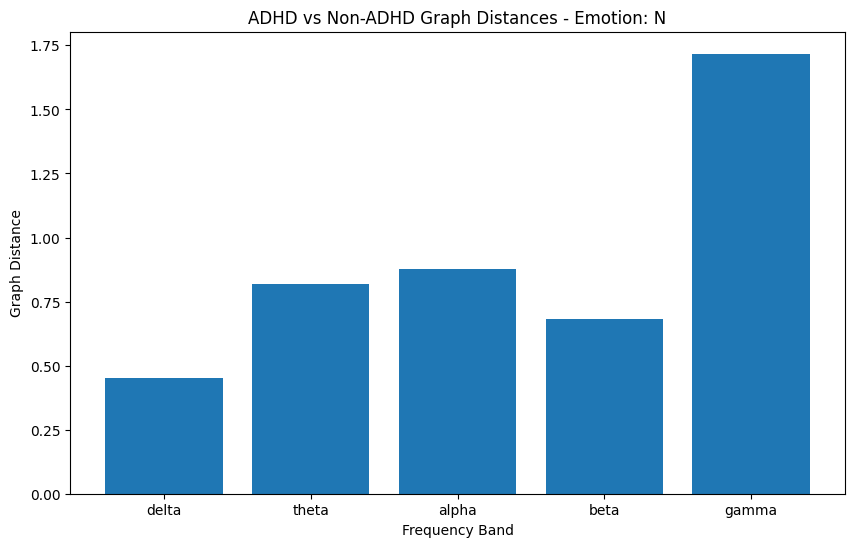


Emotion: S
  delta band: 0.5828108989318368
  theta band: 0.9531197306005104
  alpha band: 0.8820197329413708
  beta band: 0.8818779484794392
  gamma band: 2.208259562176357


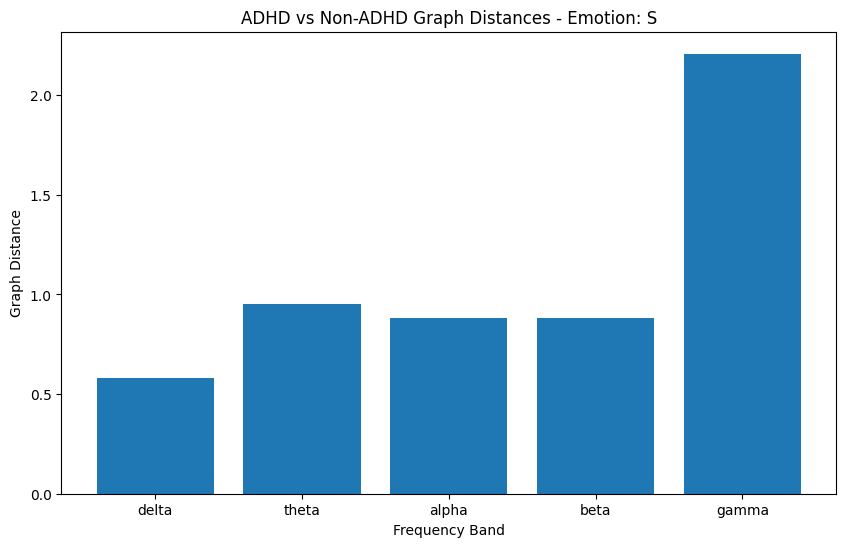

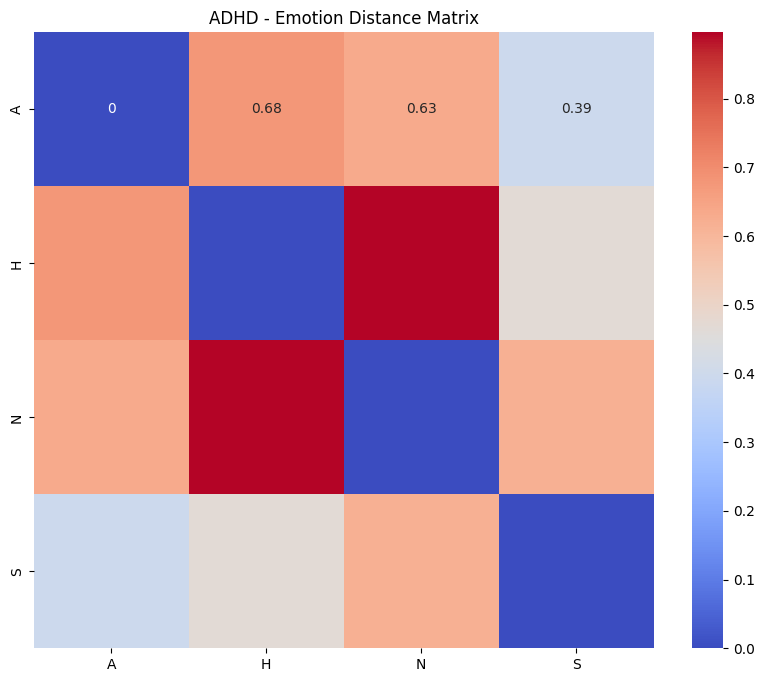

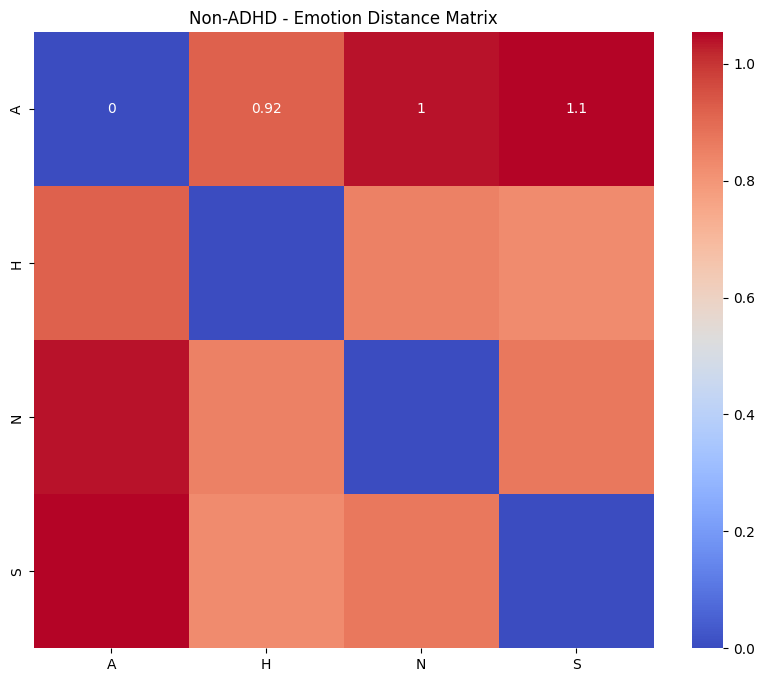


Interpretation of results:
1. XAI graphs visualize connectivity between important ICA components for each emotion and frequency band.
2. Graph distances between ADHD and Non-ADHD groups indicate:
   - Differences in brain connectivity patterns for each emotion
   - Variations across frequency bands, suggesting altered oscillatory behavior
3. Emotion distance matrices reveal:
   - Similarities and differences in brain connectivity across emotions within each group
   - Potential differences in emotional processing between ADHD and Non-ADHD groups
4. Larger distances suggest more pronounced differences in brain connectivity.
5. Consistent patterns across emotions or frequency bands may indicate:
   - Specific neural circuits affected in ADHD
   - Alterations in emotional processing or regulation
6. Differences in emotion distance matrices between groups could reflect:
   - Altered emotional differentiation in ADHD
   - Changes in the neural representation of emotions


In [1]:
# in the code below, use the data for adhad and non-adhd 
# def main():
# adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}
#non_adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}

import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import signal
from scipy.stats import pearsonr
from sklearn.decomposition import FastICA
import networkx as nx
import re

# EEG frequency bands
FREQ_BANDS = {
    'delta': (0.5, 4),
    'theta': (4, 8),
    'alpha': (8, 13),
    'beta': (13, 30),
    'gamma': (30, 100)
}

EMOTIONS = ['A', 'H', 'N', 'S']  # Angry, Happy, Neutral, Sad

def load_eeg_data(directory, emotion, n_subjects=5):
    data = {}
    subject_count = 0
    for root, dirs, files in os.walk(directory):
        for file in files:
            if file.startswith(emotion) and file.endswith('.csv'):
                match = re.search(rf'{emotion}(\d+)', file)
                if match:
                    subject = int(match.group(1))
                    filepath = os.path.join(root, file)
                    try:
                        df = pd.read_csv(filepath)
                        data[subject] = df
                        subject_count += 1
                        if subject_count == n_subjects:
                            return data
                    except Exception as e:
                        print(f"Error loading file {filepath}: {str(e)}")
    return data

def compute_functional_connectivity(data):
    n_channels = data.shape[1]
    fc_matrix = np.zeros((n_channels, n_channels))
    for i in range(n_channels):
        for j in range(i+1, n_channels):
            corr, _ = pearsonr(data[:, i], data[:, j])
            fc_matrix[i, j] = fc_matrix[j, i] = corr
    return fc_matrix

def compute_eigendecomposition(matrix):
    eigenvalues, eigenvectors = np.linalg.eig(matrix)
    idx = eigenvalues.argsort()[::-1]
    eigenvalues = eigenvalues[idx]
    eigenvectors = eigenvectors[:, idx]
    return eigenvalues / np.sum(eigenvalues), eigenvectors

def apply_bss(data, n_components=20):
    ica = FastICA(n_components=n_components, random_state=42)
    components = ica.fit_transform(data)
    return components, ica.mixing_

def xai_component_selection(components, mixing_matrix, n_select=10):
    component_importance = np.linalg.norm(mixing_matrix, axis=0)
    selected_indices = np.argsort(component_importance)[::-1][:n_select]
    return selected_indices

def compute_coherence(x, y, fs=256, nperseg=256):
    f, Cxy = signal.coherence(x, y, fs=fs, nperseg=nperseg)
    return f, Cxy

def create_xai_graphs(components, selected_indices):
    graphs = {band: nx.Graph() for band in FREQ_BANDS}
    
    for i, idx1 in enumerate(selected_indices):
        for j, idx2 in enumerate(selected_indices[i+1:], start=i+1):
            f, Cxy = compute_coherence(components[:, idx1], components[:, idx2])
            for band, (low, high) in FREQ_BANDS.items():
                mask = (f >= low) & (f <= high)
                coherence = np.mean(Cxy[mask])
                graphs[band].add_edge(idx1, idx2, weight=coherence)
    
    return graphs

def visualize_xai_graph(graph, title):
    plt.figure(figsize=(10, 8))
    pos = nx.spring_layout(graph)
    nx.draw(graph, pos, with_labels=True, node_color='lightblue', 
            node_size=500, font_size=10, font_weight='bold')
    edge_weights = nx.get_edge_attributes(graph, 'weight')
    nx.draw_networkx_edge_labels(graph, pos, edge_labels=edge_weights)
    plt.title(title)
    plt.axis('off')
    plt.show()

def compute_graph_distance(graph1, graph2):
    common_nodes = set(graph1.nodes()) & set(graph2.nodes())
    distance = 0
    for node1 in common_nodes:
        for node2 in common_nodes:
            if node1 != node2:
                weight1 = graph1[node1].get(node2, {}).get('weight', 0)
                weight2 = graph2[node1].get(node2, {}).get('weight', 0)
                distance += (weight1 - weight2) ** 2
    return np.sqrt(distance)

def compute_graph_distances(graphs1, graphs2):
    distances = {}
    for band in FREQ_BANDS:
        distances[band] = compute_graph_distance(graphs1[band], graphs2[band])
    return distances

def plot_graph_distances(distances, title):
    plt.figure(figsize=(10, 6))
    plt.bar(distances.keys(), distances.values())
    plt.title(title)
    plt.xlabel('Frequency Band')
    plt.ylabel('Graph Distance')
    plt.show()

def compute_emotion_distance_matrix(emotion_graphs):
    n_emotions = len(EMOTIONS)
    distance_matrix = np.zeros((n_emotions, n_emotions))
    for i, emotion1 in enumerate(EMOTIONS):
        for j, emotion2 in enumerate(EMOTIONS):
            if i < j:
                distances = compute_graph_distances(emotion_graphs[emotion1], emotion_graphs[emotion2])
                distance_matrix[i, j] = distance_matrix[j, i] = np.mean(list(distances.values()))
    return distance_matrix

def plot_emotion_distance_matrix(distance_matrix, title):
    plt.figure(figsize=(10, 8))
    sns.heatmap(distance_matrix, annot=True, cmap='coolwarm', xticklabels=EMOTIONS, yticklabels=EMOTIONS)
    plt.title(title)
    plt.show()

# edit the following to use the EEG data for ADHD and non-ADHD
def main():
    adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}
    non_adhd_data = {emotion: load_eeg_data('ADHD_csv', emotion) for emotion in EMOTIONS}

    groups = {'ADHD': adhd_data, 'Non-ADHD': non_adhd_data}
    xai_graphs = {group: {} for group in groups}

    for group, data in groups.items():
        print(f"\nProcessing {group}")
        
        for emotion in EMOTIONS:
            if not data[emotion]:
                print(f"No data available for {group}, Emotion: {emotion}")
                continue
            
            combined_data = np.concatenate([subject_data.values for subject_data in data[emotion].values()], axis=0)
            print(f"Combined data shape for {group}, Emotion {emotion}: {combined_data.shape}")
            
            fc_matrix = compute_functional_connectivity(combined_data)
            eigenvalues, eigenvectors = compute_eigendecomposition(fc_matrix)
            components, mixing_matrix = apply_bss(combined_data)
            selected_indices = xai_component_selection(components, mixing_matrix)
            xai_graphs[group][emotion] = create_xai_graphs(components, selected_indices)
            
            for band, graph in xai_graphs[group][emotion].items():
                visualize_xai_graph(graph, f"{group} - {emotion} - {band} band XAI Graph")

    # Compare ADHD and Non-ADHD XAI graphs for each emotion and frequency band
    print("\nGraph distances between ADHD and Non-ADHD:")
    for emotion in EMOTIONS:
        distances = compute_graph_distances(xai_graphs['ADHD'][emotion], xai_graphs['Non-ADHD'][emotion])
        print(f"\nEmotion: {emotion}")
        for band, distance in distances.items():
            print(f"  {band} band: {distance}")
        plot_graph_distances(distances, f"ADHD vs Non-ADHD Graph Distances - Emotion: {emotion}")

    # Compute and visualize emotion distance matrices for each group
    for group in groups:
        distance_matrix = compute_emotion_distance_matrix(xai_graphs[group])
        plot_emotion_distance_matrix(distance_matrix, f"{group} - Emotion Distance Matrix")

    print("\nInterpretation of results:")
    print("1. XAI graphs visualize connectivity between important ICA components for each emotion and frequency band.")
    print("2. Graph distances between ADHD and Non-ADHD groups indicate:")
    print("   - Differences in brain connectivity patterns for each emotion")
    print("   - Variations across frequency bands, suggesting altered oscillatory behavior")
    print("3. Emotion distance matrices reveal:")
    print("   - Similarities and differences in brain connectivity across emotions within each group")
    print("   - Potential differences in emotional processing between ADHD and Non-ADHD groups")
    print("4. Larger distances suggest more pronounced differences in brain connectivity.")
    print("5. Consistent patterns across emotions or frequency bands may indicate:")
    print("   - Specific neural circuits affected in ADHD")
    print("   - Alterations in emotional processing or regulation")
    print("6. Differences in emotion distance matrices between groups could reflect:")
    print("   - Altered emotional differentiation in ADHD")
    print("   - Changes in the neural representation of emotions")
   

if __name__ == "__main__":
    main()